# Affordance Heatmaps

This notebook visualizes the pick and place affordance predictions of a pre-trained `multi-language-conditioned` agent from the quickstart guide.

### Setup

- Set the root folder environment variable with `export CLIPORT_ROOT=<cliport_root>`
- Complete the [quickstart guide](https://github.com/cliport/cliport#quickstart) in README.md
- Generate `val` and `test` splits for the task you want to evaluate on by running `python cliport/demos.py n=10 mode=test task=stack-block-pyramid-seq-seen-colors`

In [7]:
# export CLIPORT_ROOT=/home/bobwu/Documents/UQ/cliport

In [8]:
!pip install packaging==21.3

DEPRECATION: omegaconf 2.0.6 has a non-standard dependency specifier PyYAML>=5.1.*. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of omegaconf or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [9]:
%env CLIPORT_ROOT=/home/bobwu/Documents/UQ/cliport

env: CLIPORT_ROOT=/home/bobwu/Documents/UQ/cliport


In [10]:
# set GPU
%env CUDA_VISIBLE_DEVICES=0

import os
import sys
import json

import numpy as np
from cliport import tasks
from cliport import agents
from cliport.utils import utils

import torch
import cv2
from cliport.dataset import RavensDataset
from cliport.environments.environment import Environment

%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

env: CUDA_VISIBLE_DEVICES=0


### Settings

In [11]:
train_demos = 1000 # number training demonstrations used to train agent
n_eval = 1 # number of evaluation instances
mode = 'test' # val or test

agent_name = 'cliport'
model_task = 'multi-language-conditioned' # multi-task agent conditioned with language goals

model_folder = 'cliport_quickstart' # path to pre-trained checkpoint
ckpt_name = 'steps=400000-val_loss=0.00014655.ckpt' # name of checkpoint to load

draw_grasp_lines = True
affordance_heatmap_scale = 30

### Uncomment the task you want to evaluate on ###
# eval_task = 'align-rope'
# eval_task = 'assembling-kits-seq-seen-colors'
# eval_task = 'assembling-kits-seq-unseen-colors'
# eval_task = 'packing-shapes'
# eval_task = 'packing-boxes-pairs-seen-colors'
# eval_task = 'packing-boxes-pairs-unseen-colors'
# eval_task = 'packing-seen-google-objects-seq'
# eval_task = 'packing-unseen-google-objects-seq'
# eval_task = 'packing-seen-google-objects-group'
# eval_task = 'packing-unseen-google-objects-group'
# eval_task = 'put-block-in-bowl-seen-colors'
# eval_task = 'put-block-in-bowl-unseen-colors'

# eval_task = 'stack-block-pyramid-seq-seen-colors'
eval_task = 'stack-block-pyramid-seq-unseen-colors'
# eval_task = 'separating-piles-seen-colors'
# eval_task = 'separating-piles-unseen-colors'
# eval_task = 'towers-of-hanoi-seq-seen-colors'
# eval_task = 'towers-of-hanoi-seq-unseen-colors'

### Load Configs and Agent

In [12]:
root_dir = os.environ['CLIPORT_ROOT']
assets_root = os.path.join(root_dir, 'cliport/environments/assets/')
config_file = 'eval.yaml' 

vcfg = utils.load_hydra_config(os.path.join(root_dir, f'cliport/cfg/{config_file}'))
vcfg['data_dir'] = os.path.join(root_dir, 'data')
vcfg['mode'] = mode

vcfg['model_task'] = model_task
vcfg['eval_task'] = eval_task
vcfg['agent'] = agent_name

# Model and training config paths
model_path = os.path.join(root_dir, model_folder)
vcfg['train_config'] = f"{model_path}/{vcfg['model_task']}-{vcfg['agent']}-n{train_demos}-train/.hydra/config.yaml"
vcfg['model_path'] = f"{model_path}/{vcfg['model_task']}-{vcfg['agent']}-n{train_demos}-train/checkpoints/"

tcfg = utils.load_hydra_config(vcfg['train_config'])

# Load dataset
ds = RavensDataset(os.path.join(vcfg['data_dir'], f'{vcfg["eval_task"]}-{vcfg["mode"]}'), 
                   tcfg, 
                   n_demos=n_eval,
                   augment=False)

eval_run = 0
name = '{}-{}-{}-{}'.format(vcfg['eval_task'], vcfg['agent'], n_eval, eval_run)
print(f'\nEval ID: {name}\n')

# Initialize agent
utils.set_seed(eval_run, torch=True)
agent = agents.names[vcfg['agent']](name, tcfg, None, ds)

# Load checkpoint
ckpt_path = os.path.join(vcfg['model_path'], ckpt_name)
print(f'\nLoading checkpoint: {ckpt_path}')
agent.load(ckpt_path)


Eval ID: stack-block-pyramid-seq-unseen-colors-cliport-1-0



Attn FCN - Stream One: plain_resnet_lat, Stream Two: clip_lingunet_lat, Stream Fusion: add
Transport FCN - Stream One: plain_resnet_lat, Stream Two: clip_lingunet_lat, Stream Fusion: conv
Agent: stack-block-pyramid-seq-unseen-colors-cliport-1-0, Logging: False

Loading checkpoint: /home/bobwu/Documents/UQ/cliport/cliport_quickstart/multi-language-conditioned-cliport-n1000-train/checkpoints/steps=400000-val_loss=0.00014655.ckpt


### Spawn Environment

In [13]:
# Initialize environment and task.
env = Environment(
    assets_root,
    disp=False,
    shared_memory=False,
    hz=480,
    record_cfg=False
)

text argument:/home/bobwu/Documents/UQ/cliport/cliport/environments/assets/
int args: [

### Evaluate Agent


Evaluation Instance: 1/10
Step: 0 (12 max)


/home/bobwu/anaconda3/envs/cliport_env/lib/python3.8/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Goal: put the purple block on the lightest brown block


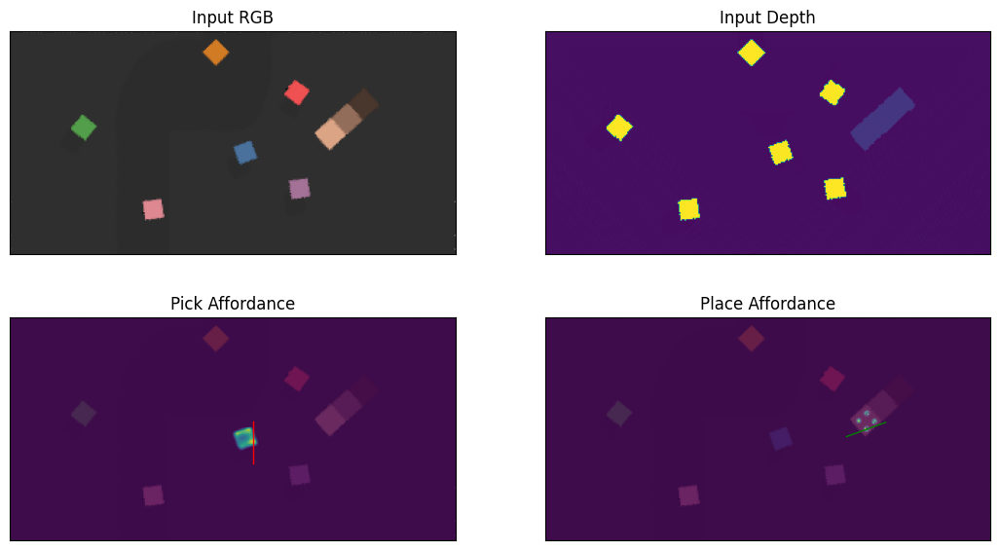

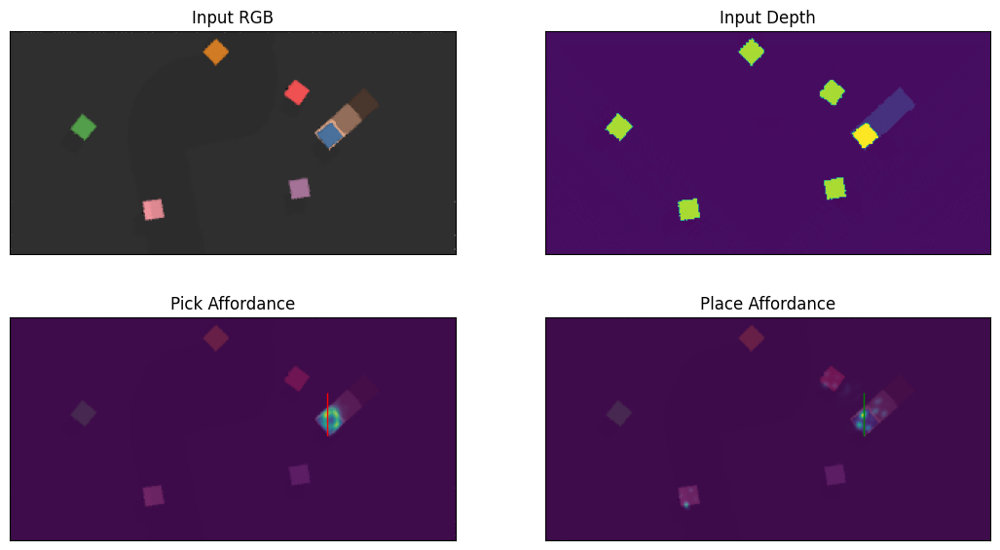

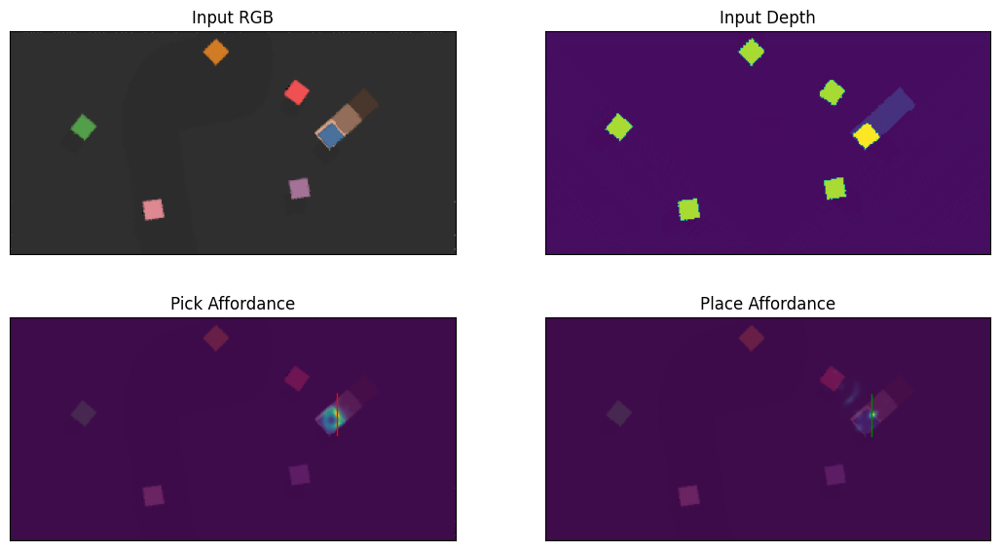

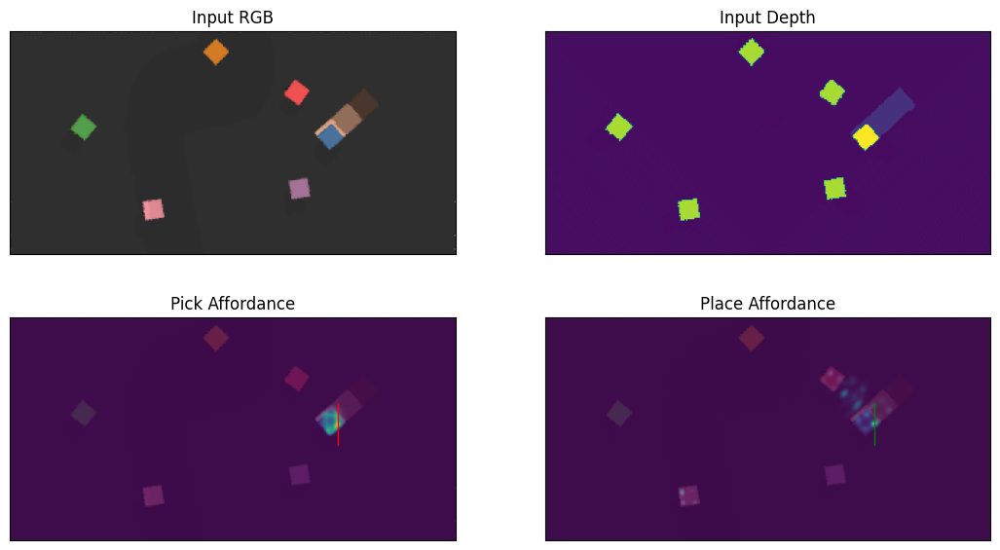

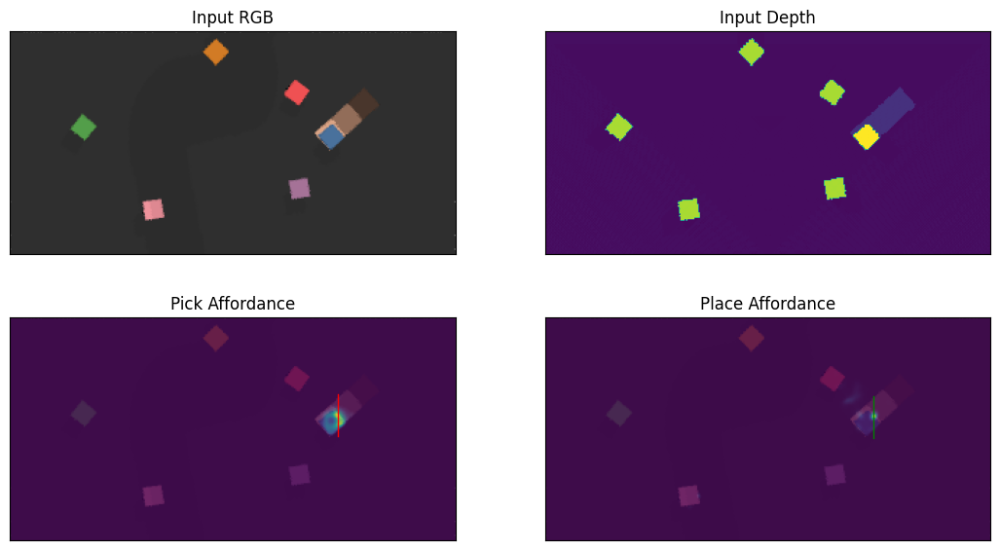

...

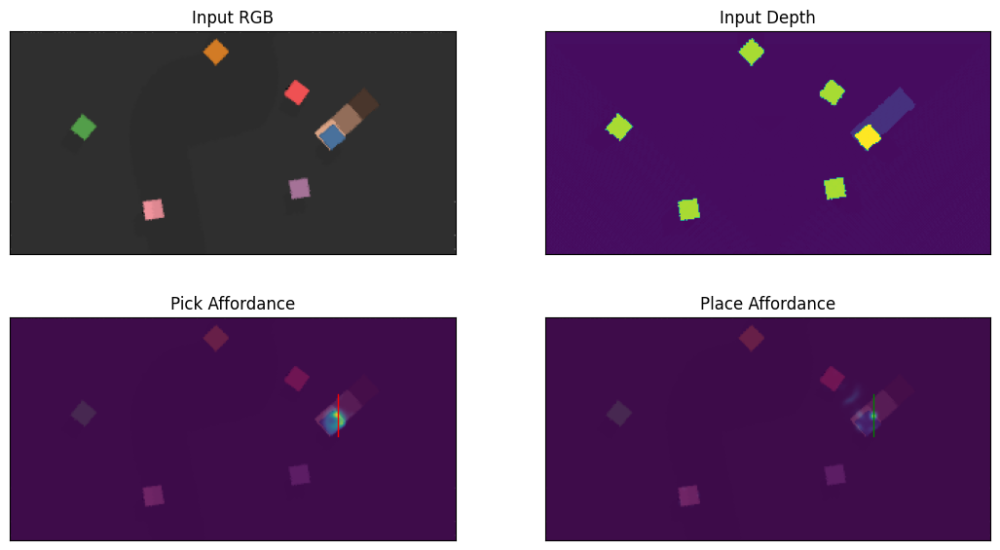

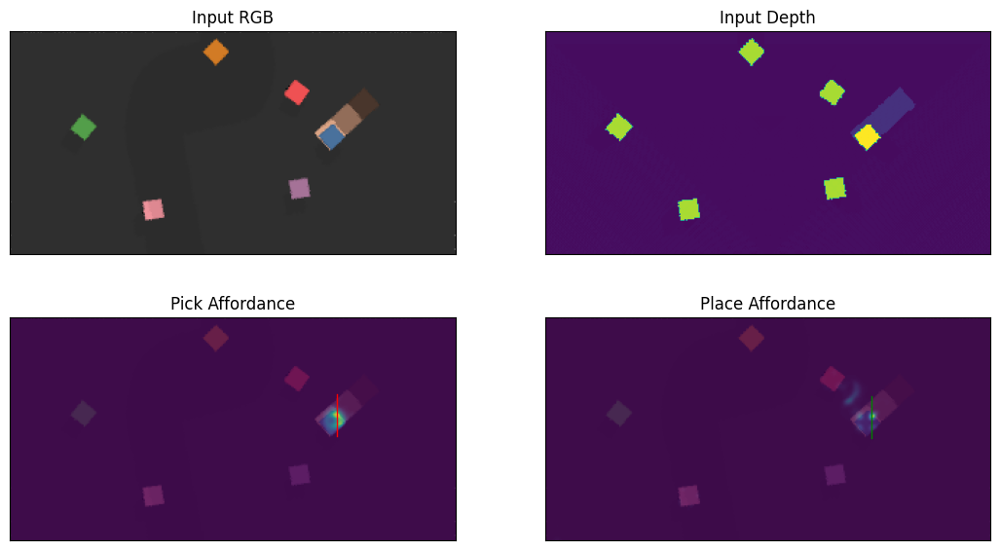

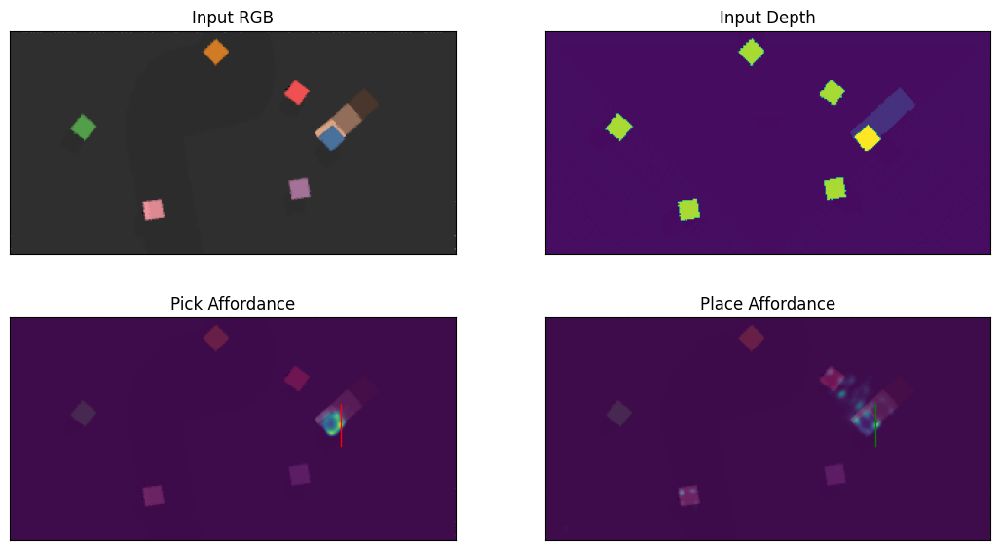

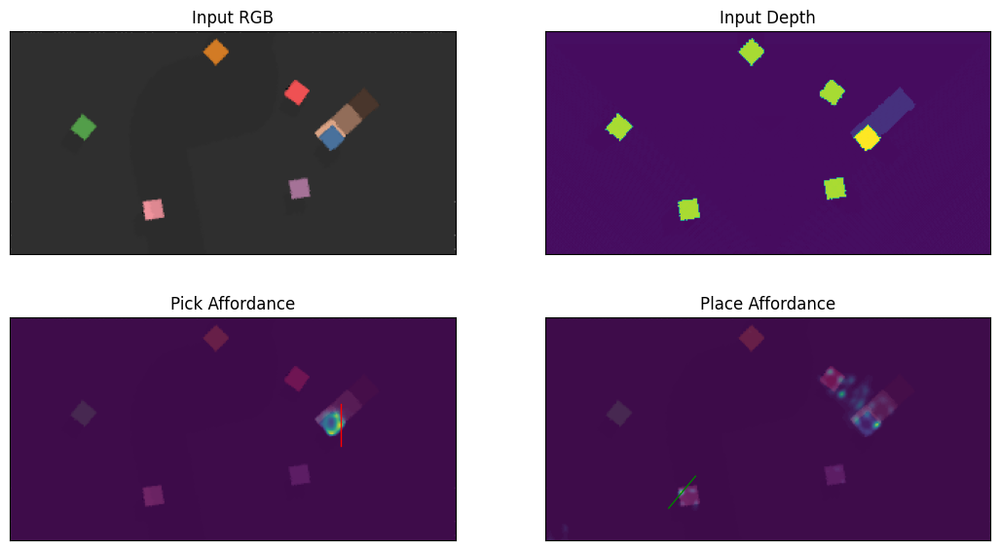

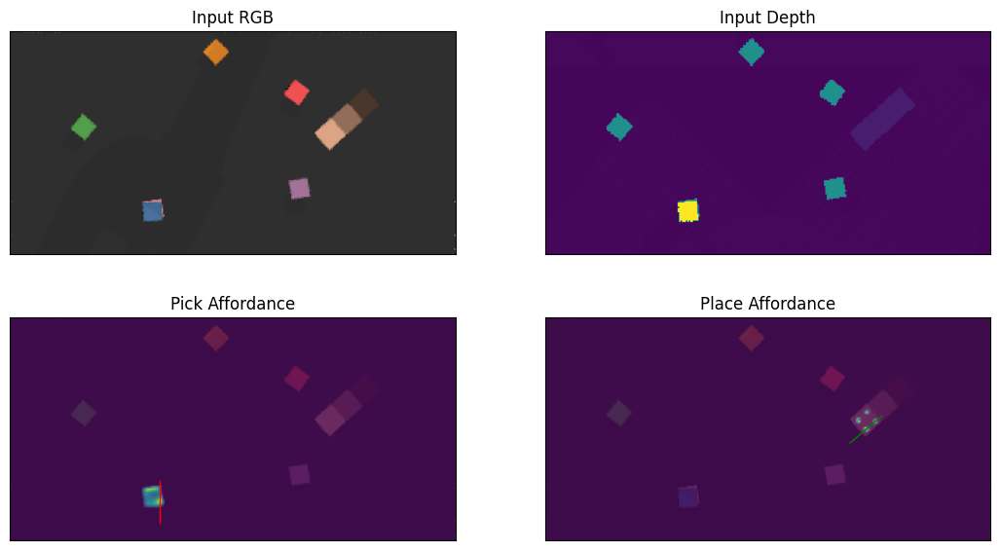

Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Lang Goal: put the purple block on the lightest brown block
Max steps reached. Task failed.

Evaluation Instance: 2/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 ma

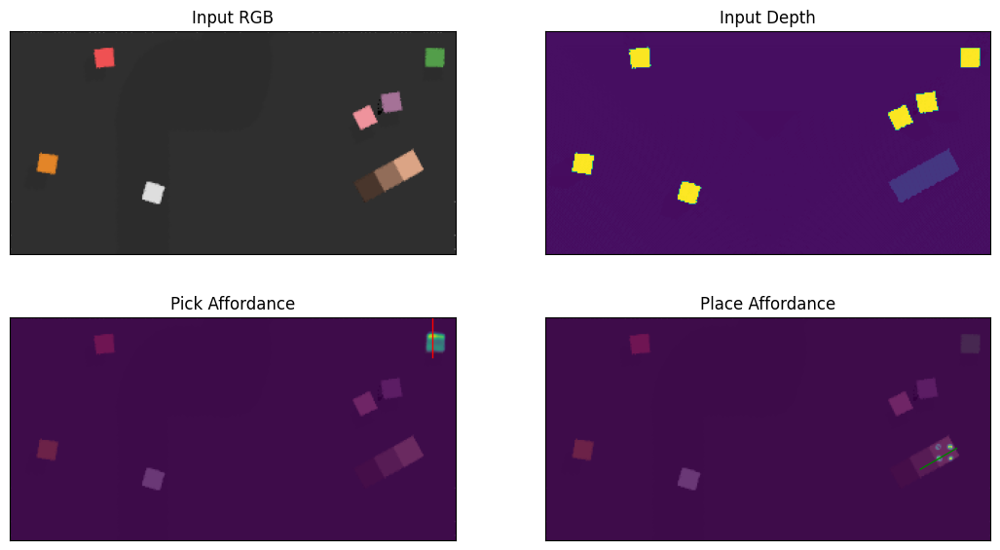

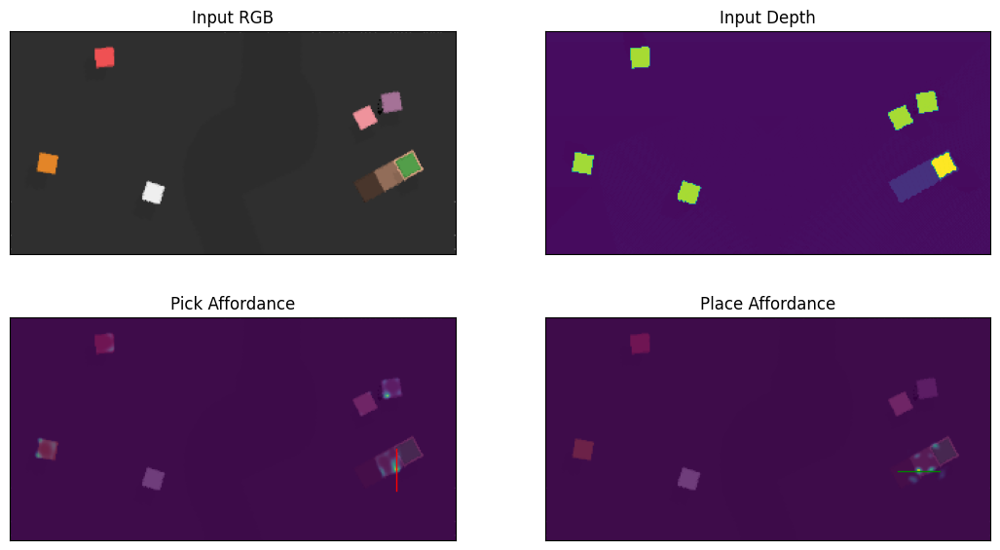

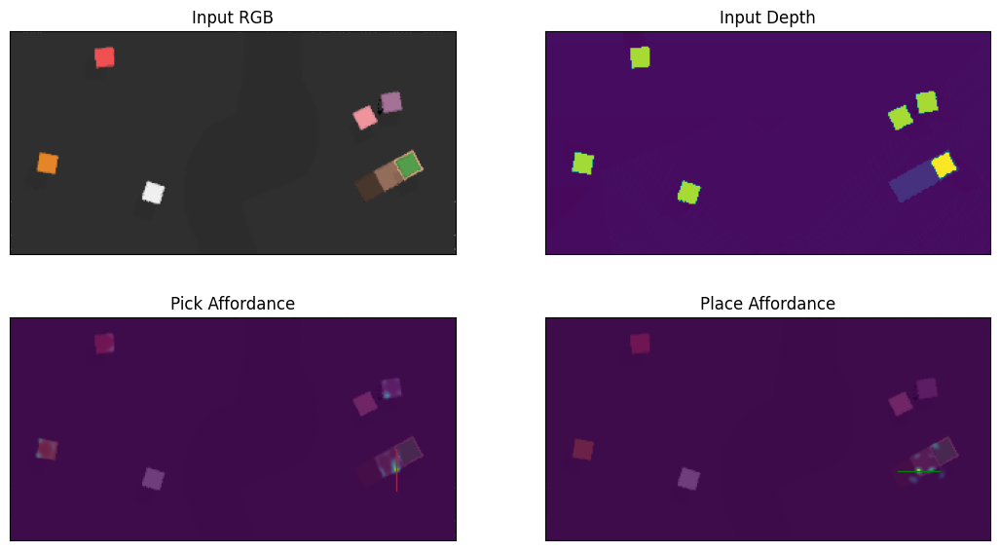

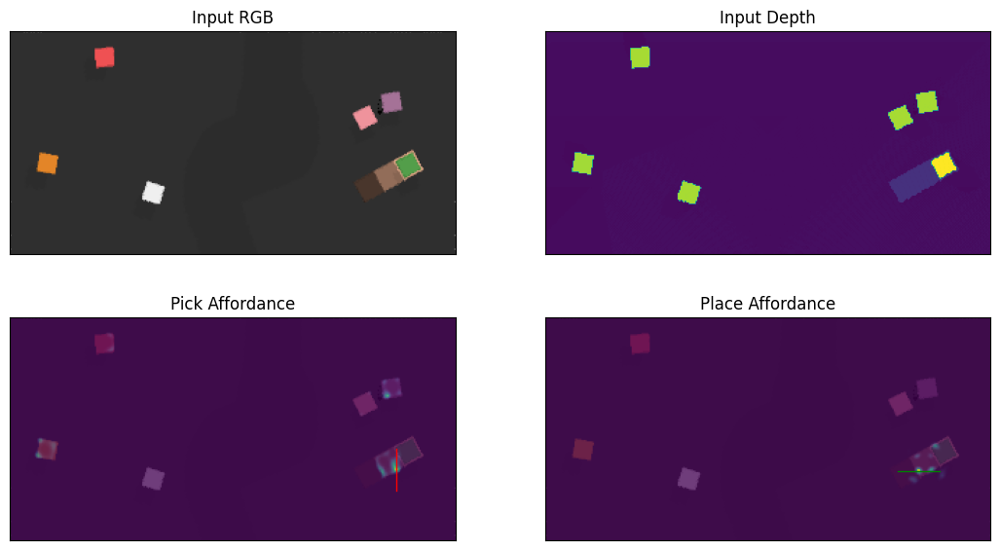

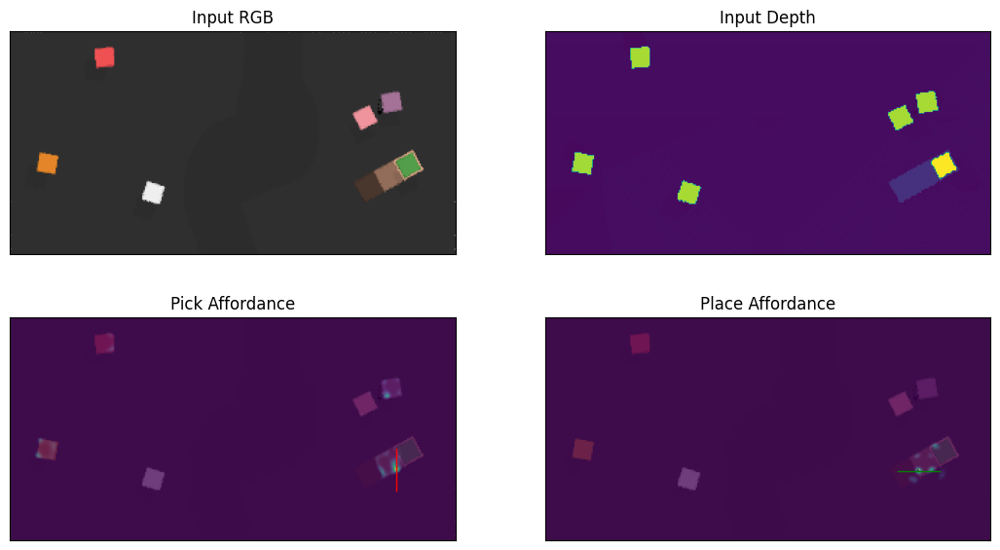

...

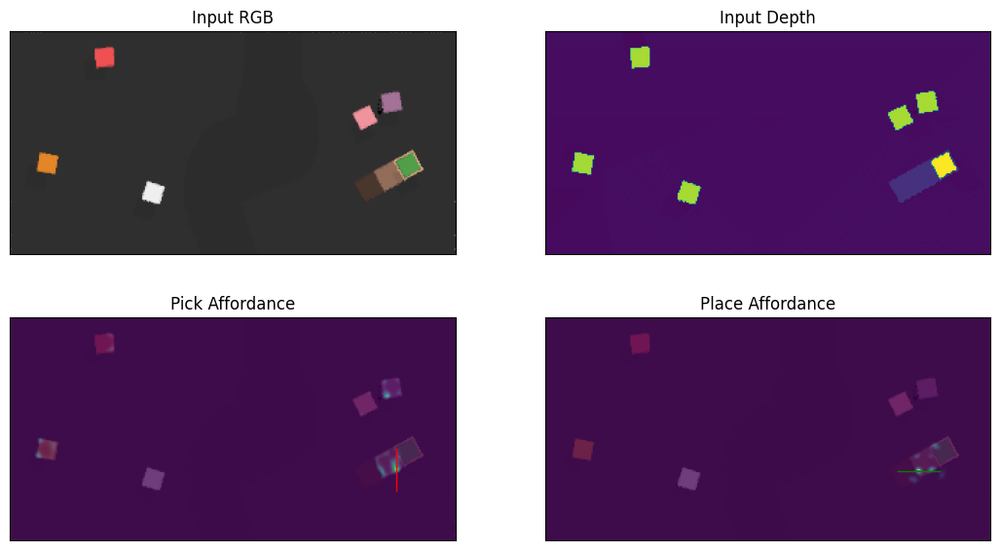

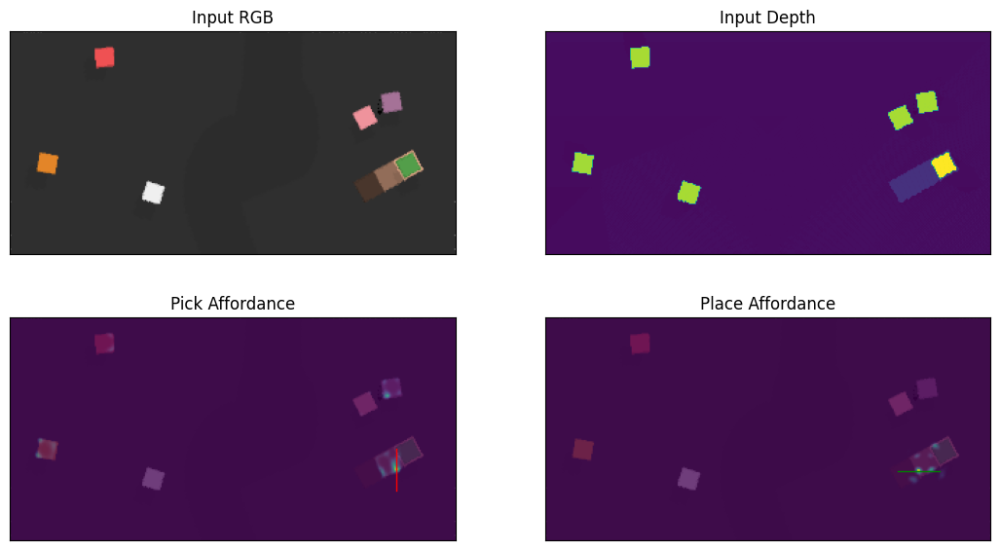

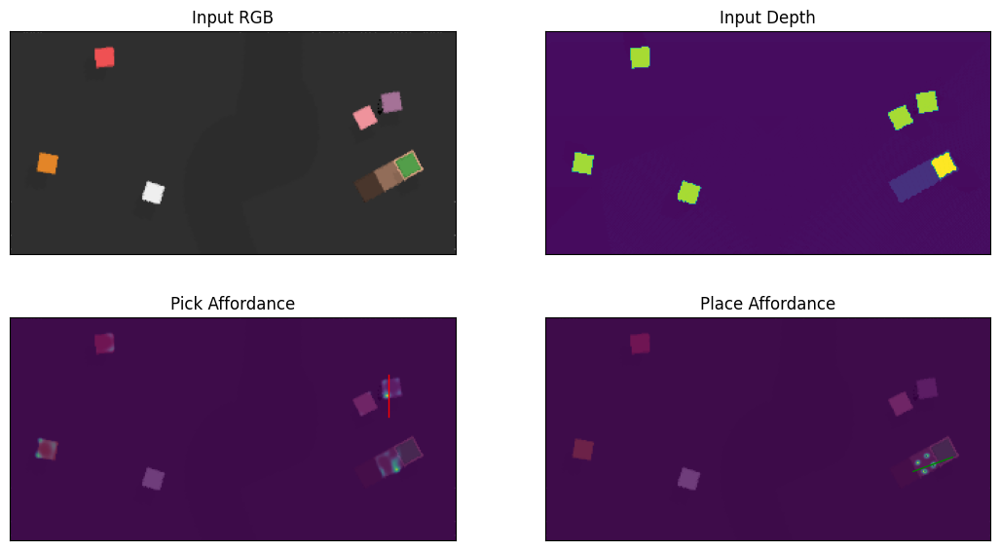

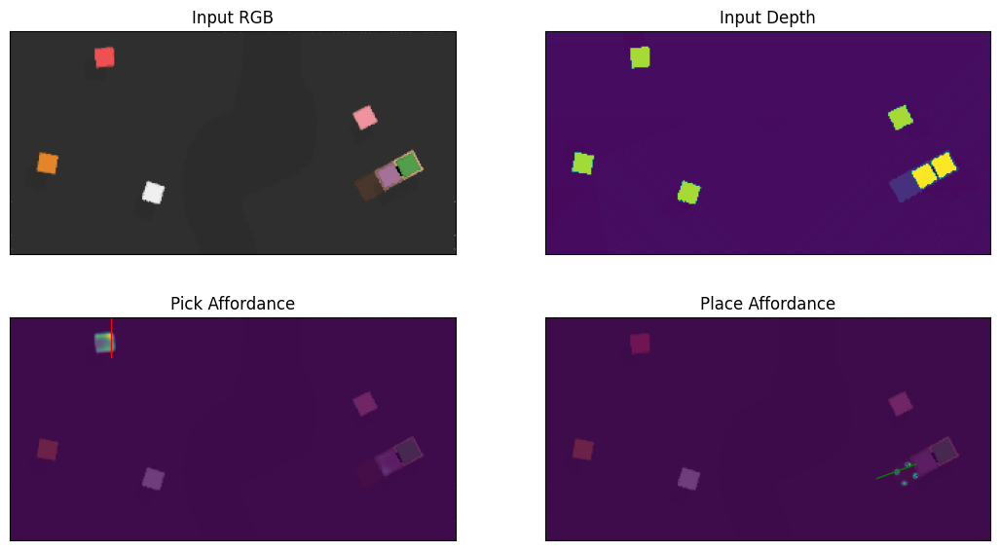

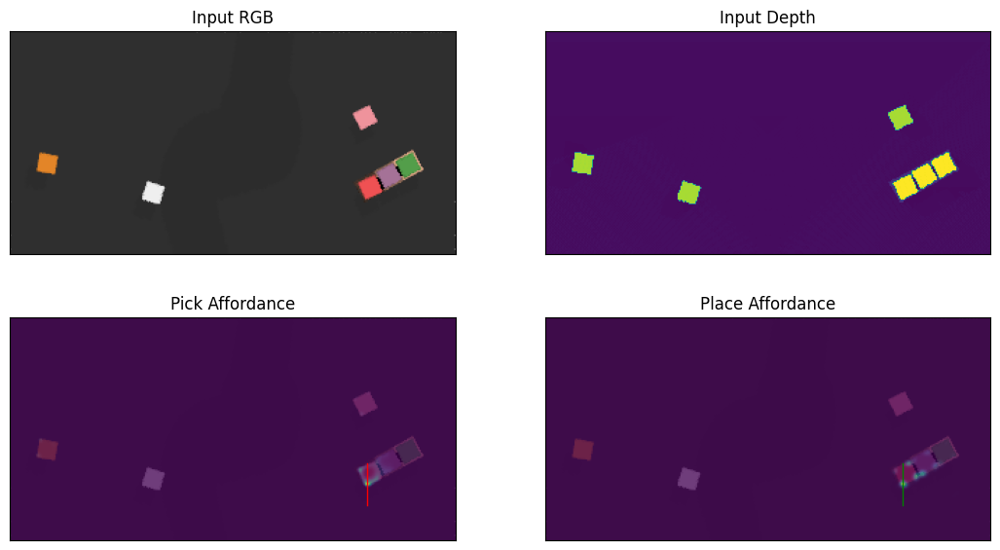

Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the purple block on the middle brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Max steps reached. Task failed.

Evaluation Instance: 3/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Goal: put the orang

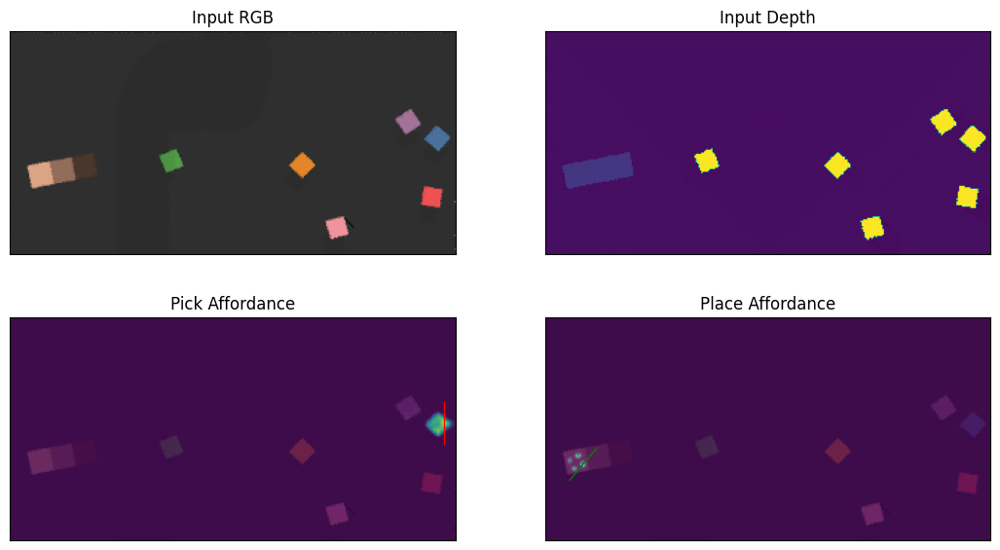

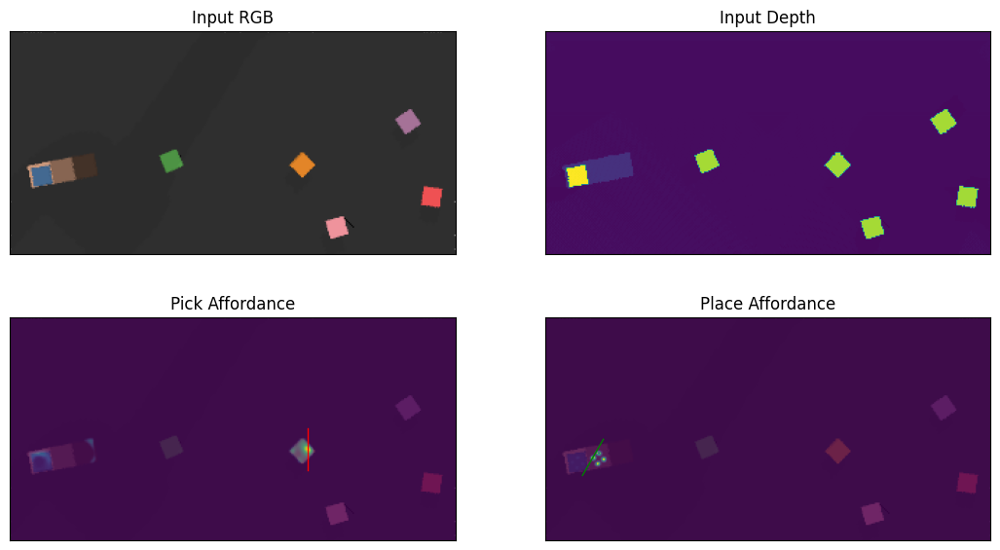

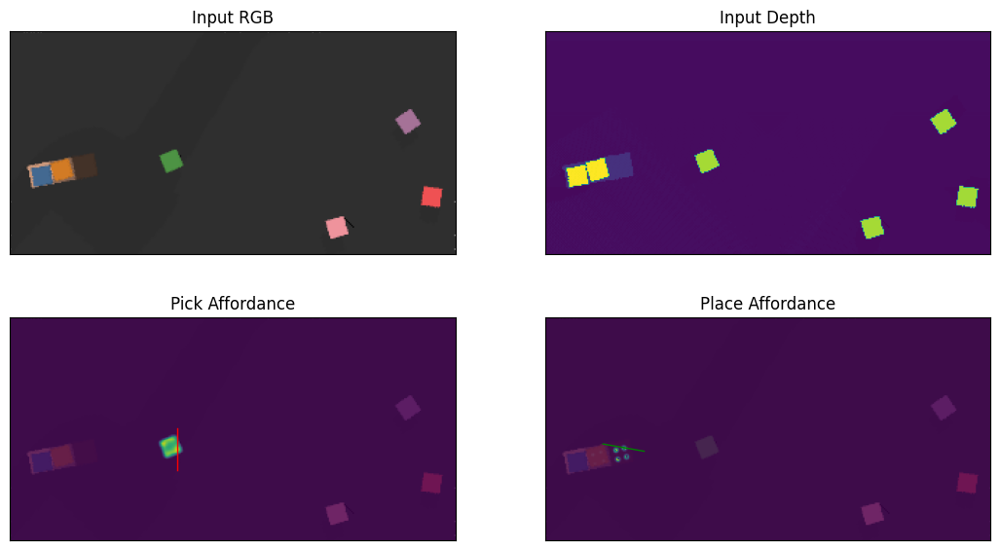

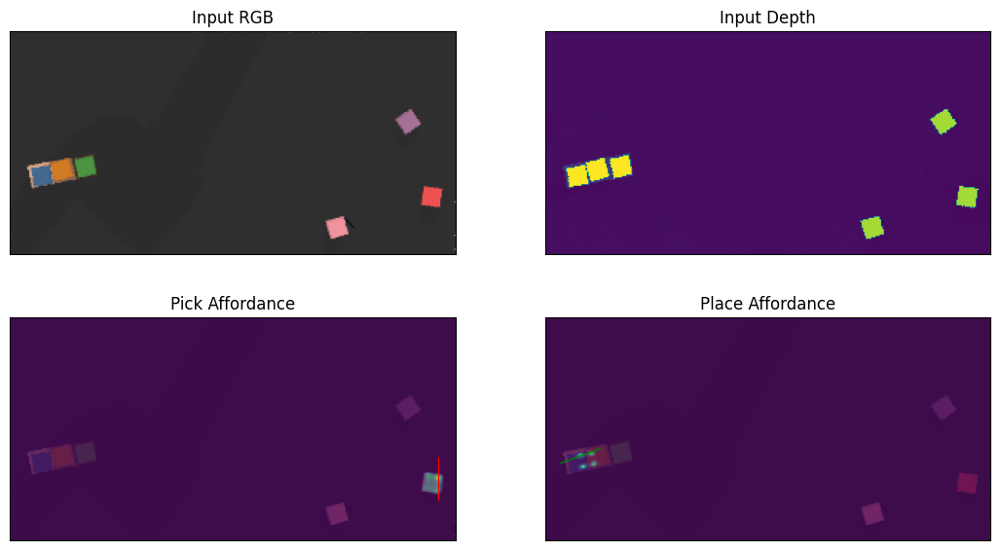

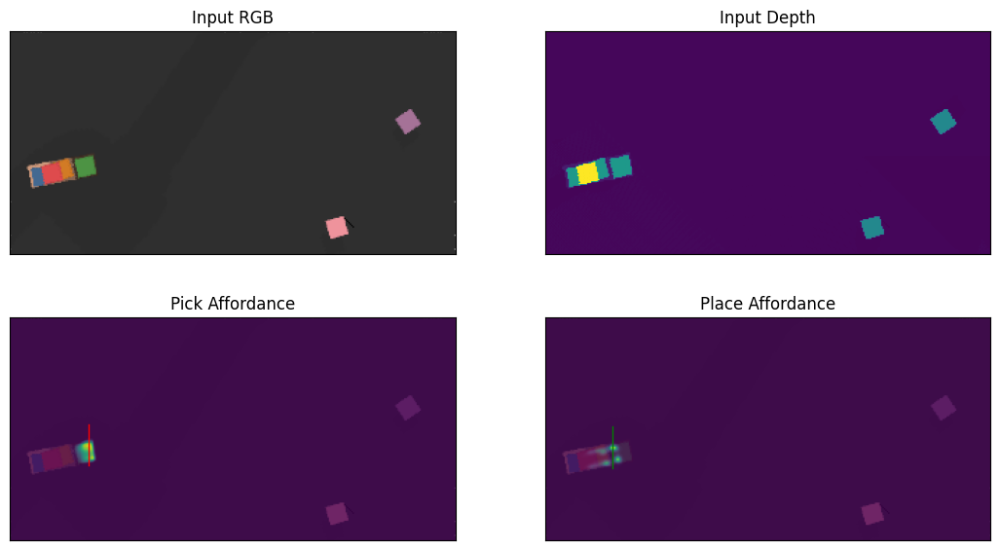

...

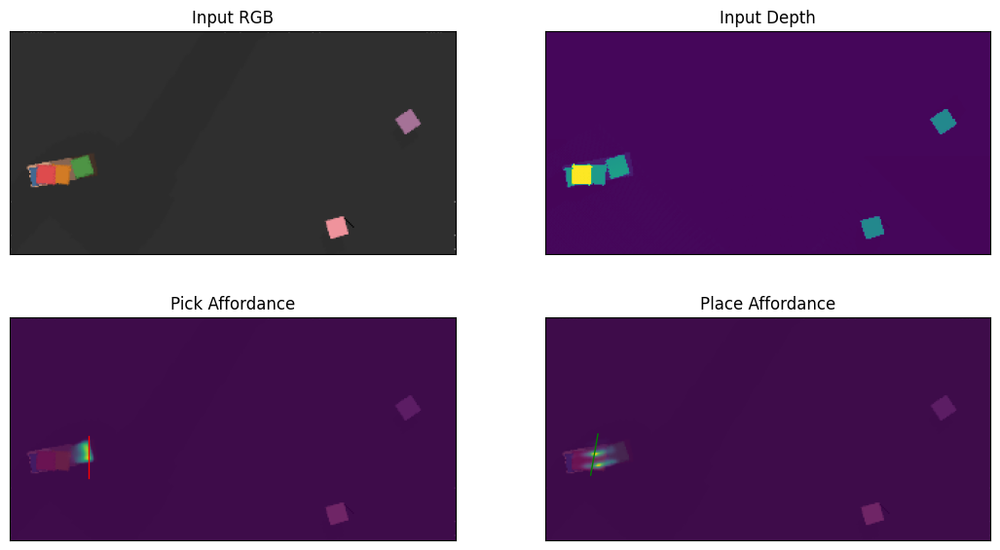

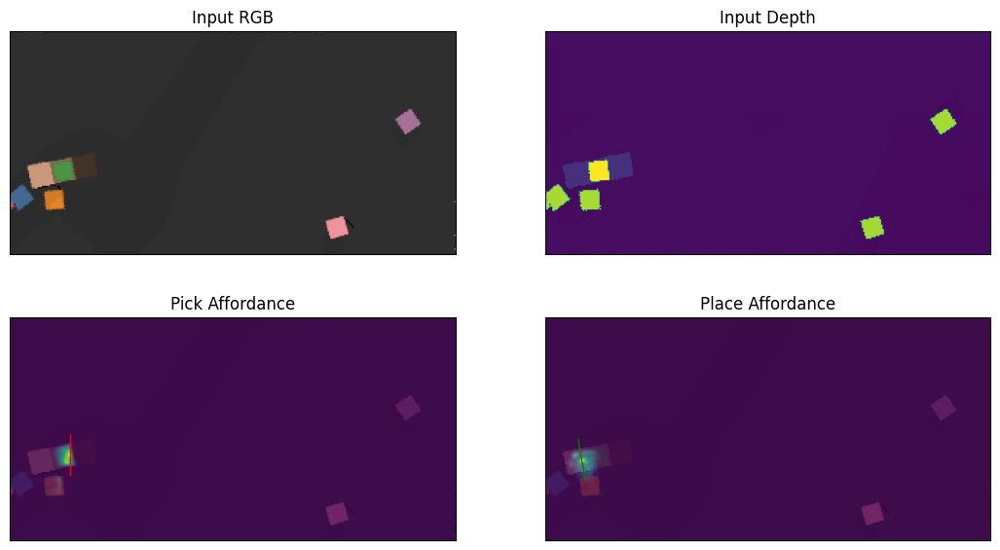

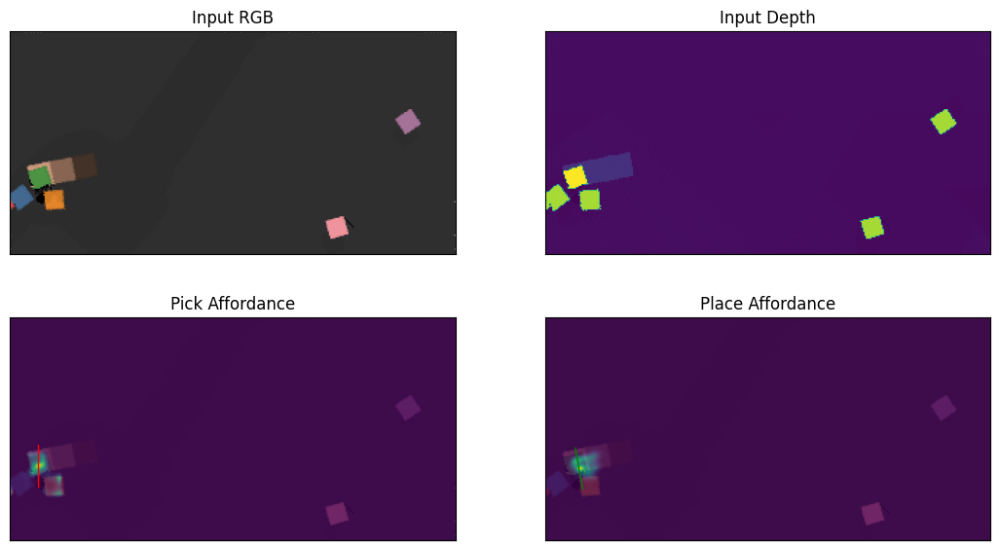

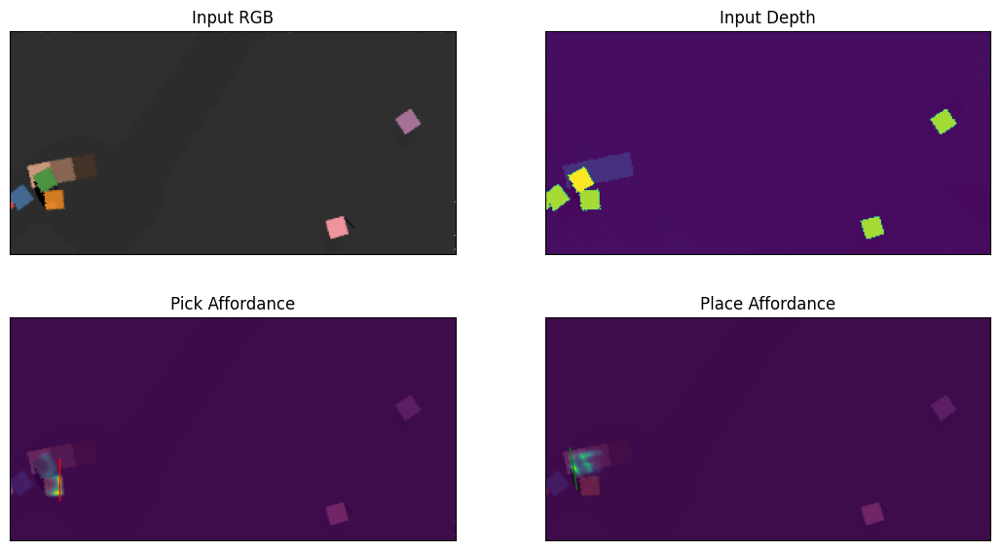

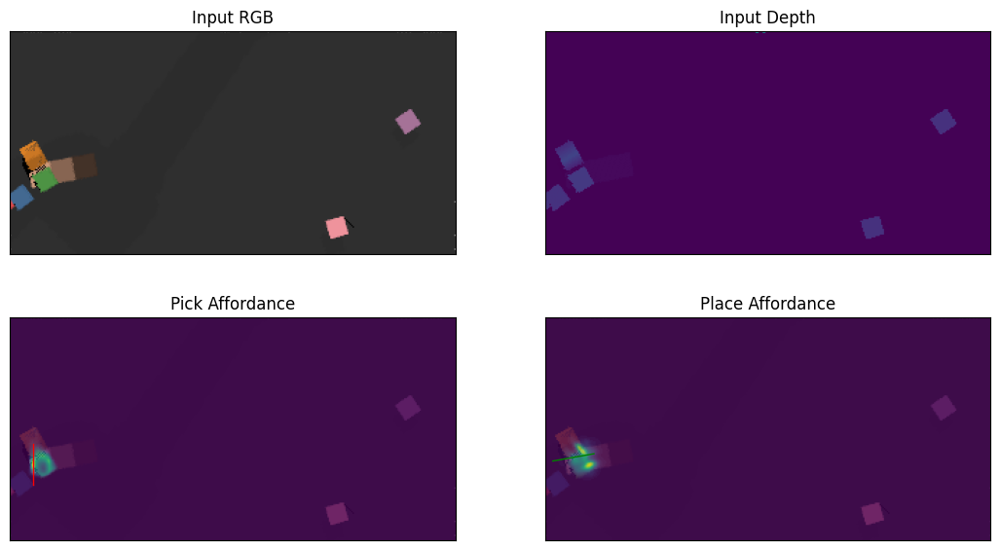

Lang Goal: put the green block on the darkest brown block
Lang Goal: put the red block on the blue and orange blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Lang Goal: put the pink block on the orange and green blocks
Max steps reached. Task failed.

Evaluation Instance: 4/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12

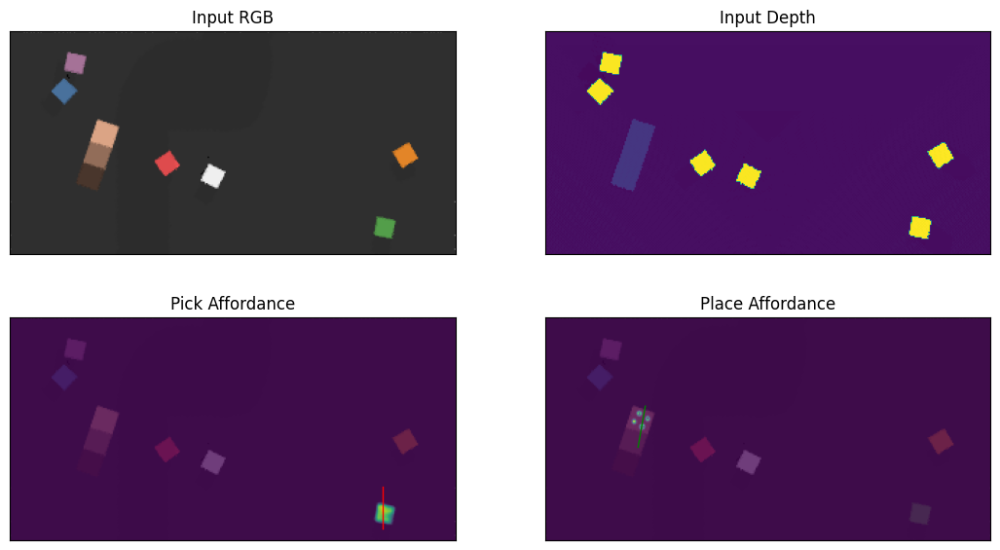

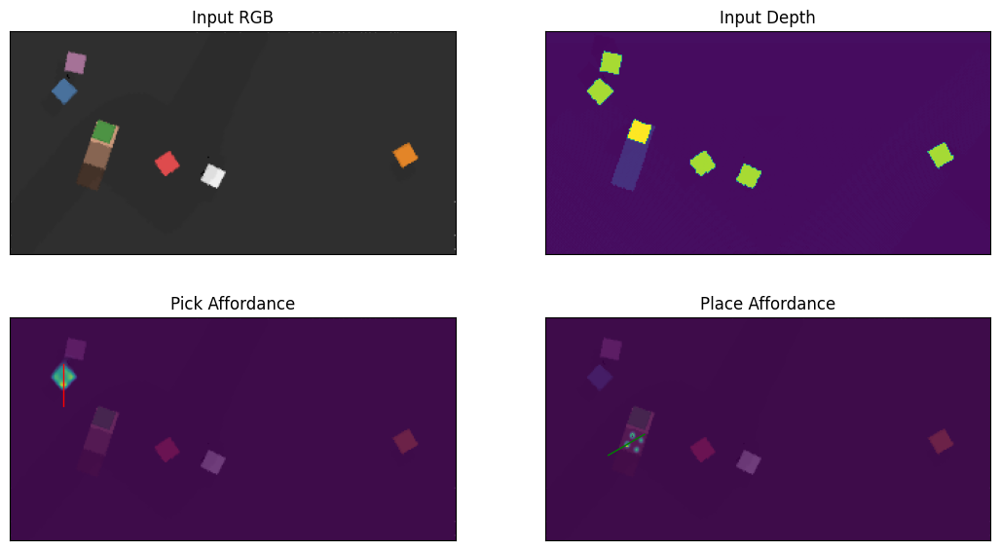

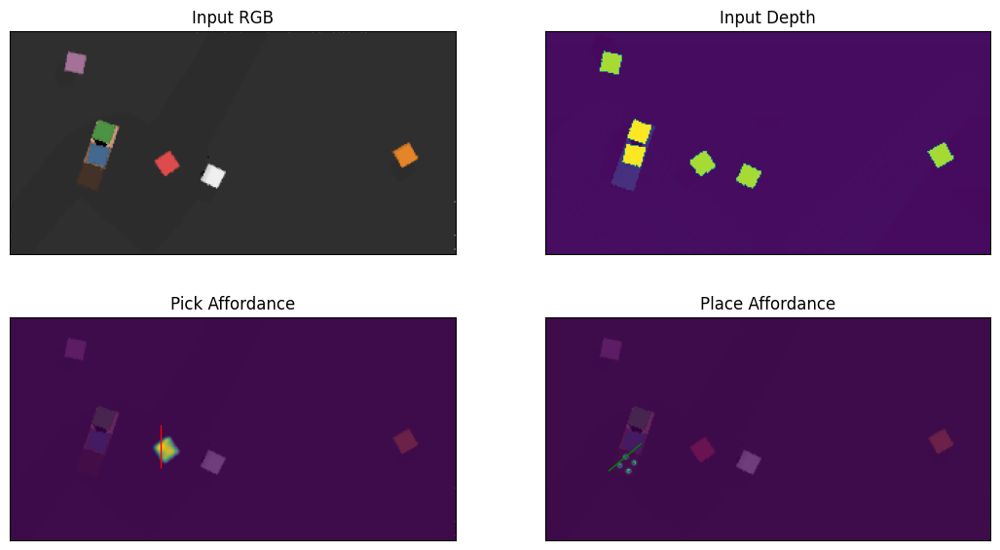

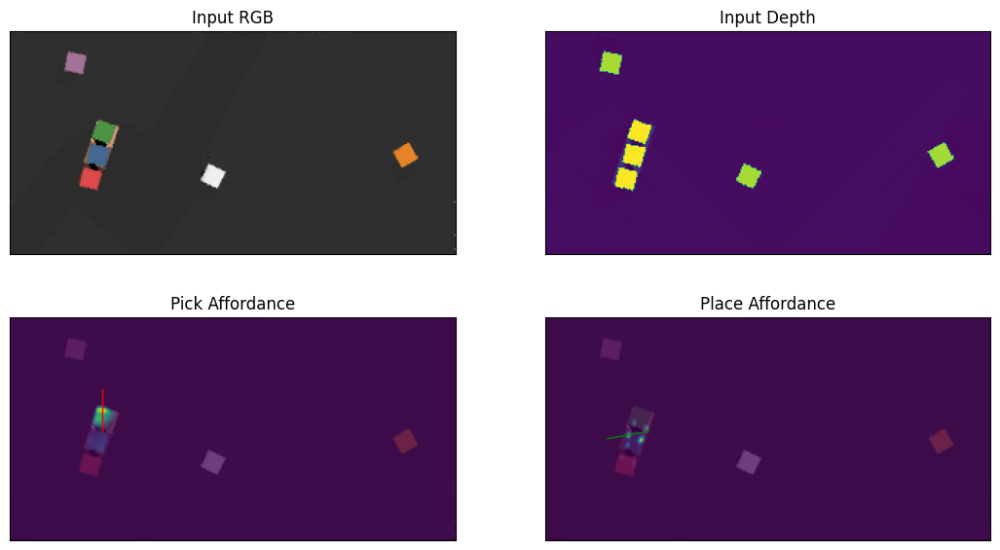

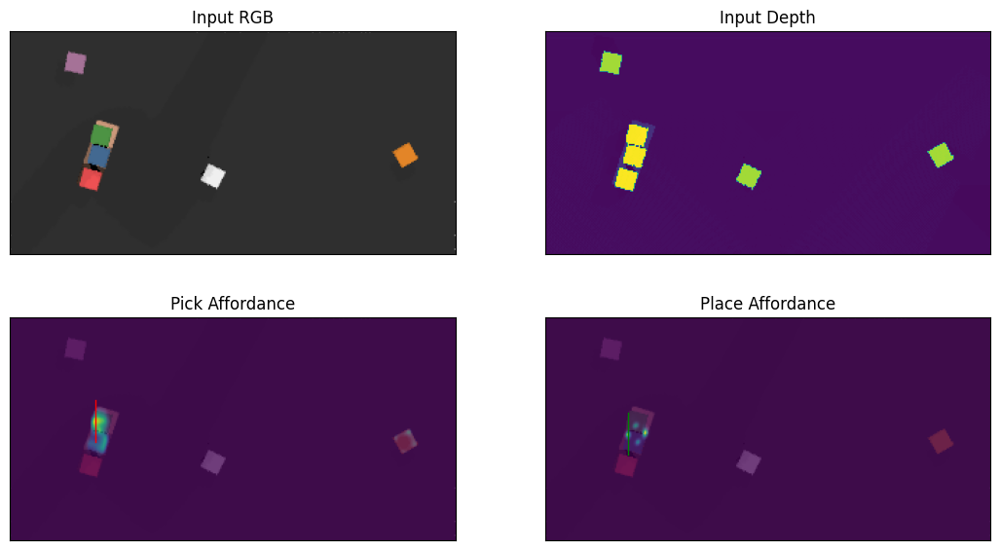

...

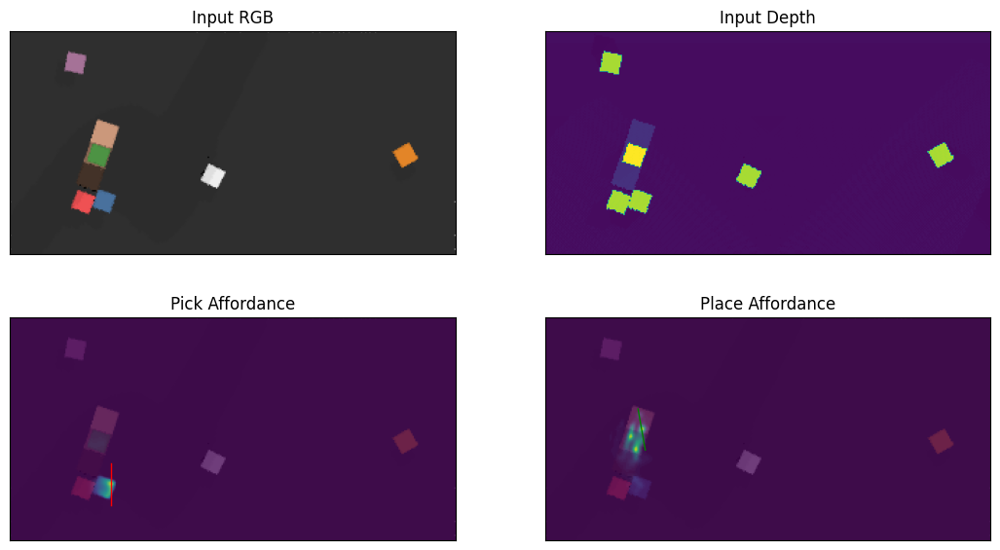

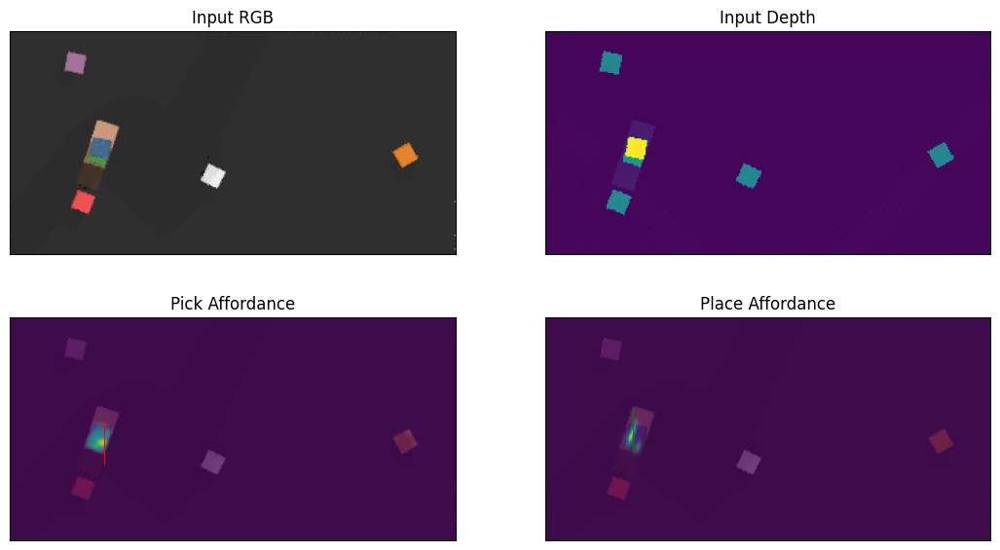

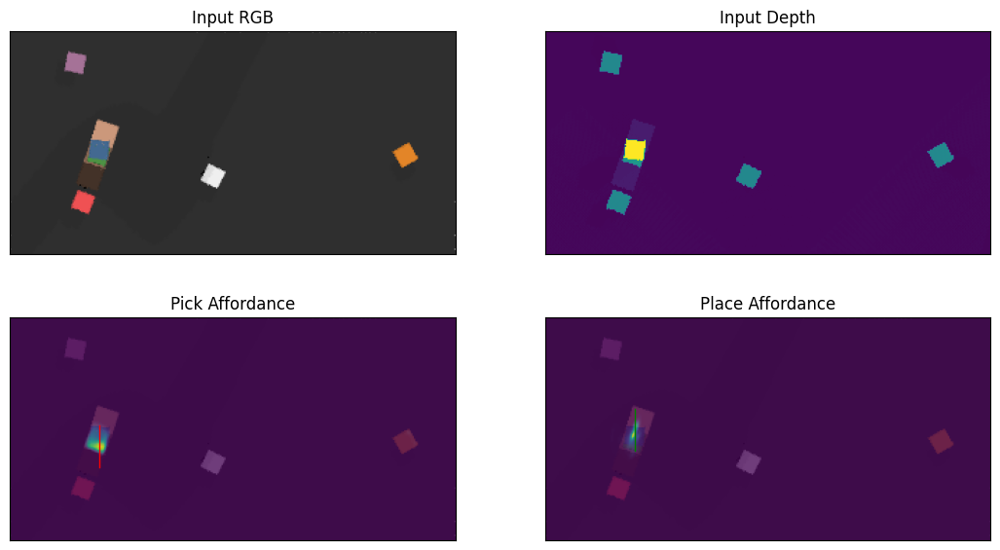

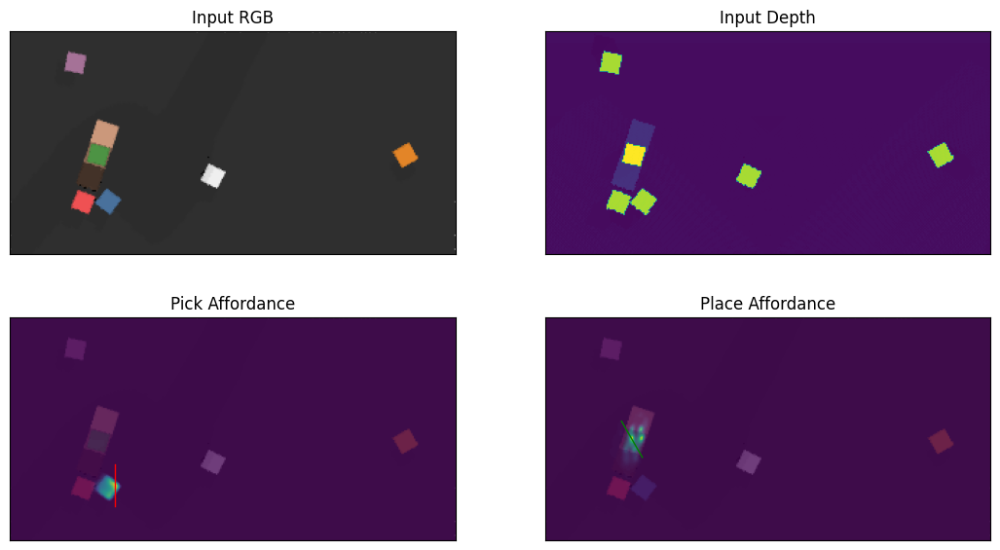

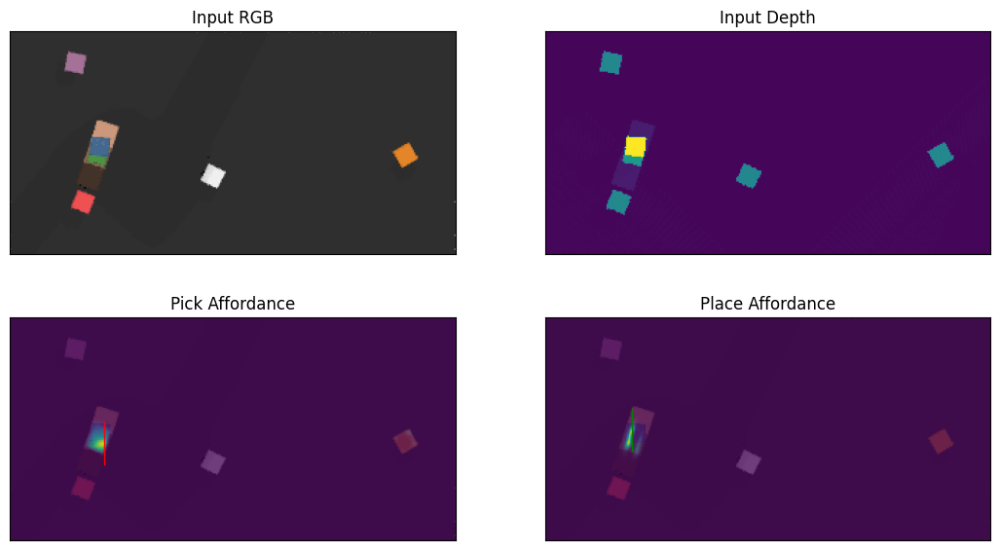

Lang Goal: put the red block on the darkest brown block
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Lang Goal: put the orange block on the green and blue blocks
Max steps reached. Task failed.

Evaluation Instance: 5/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12

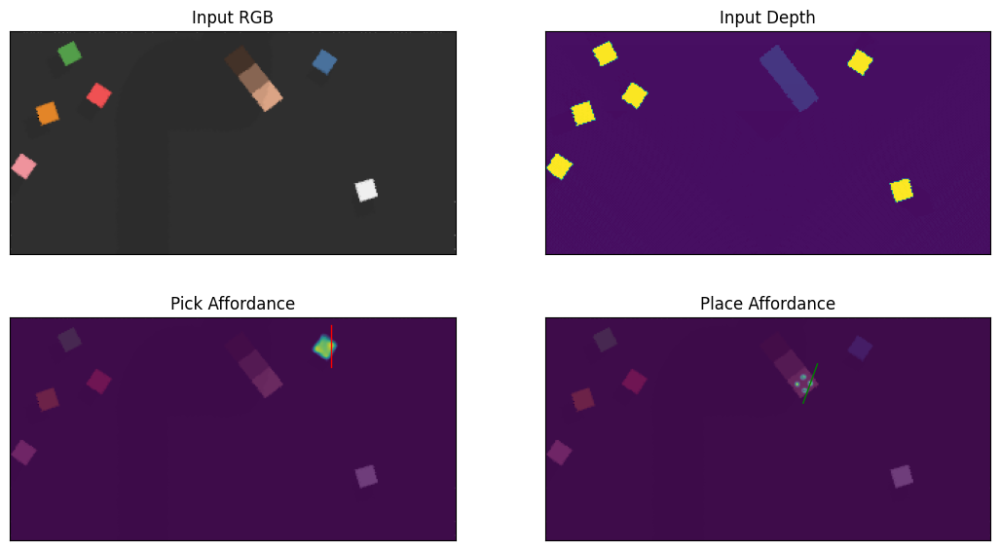

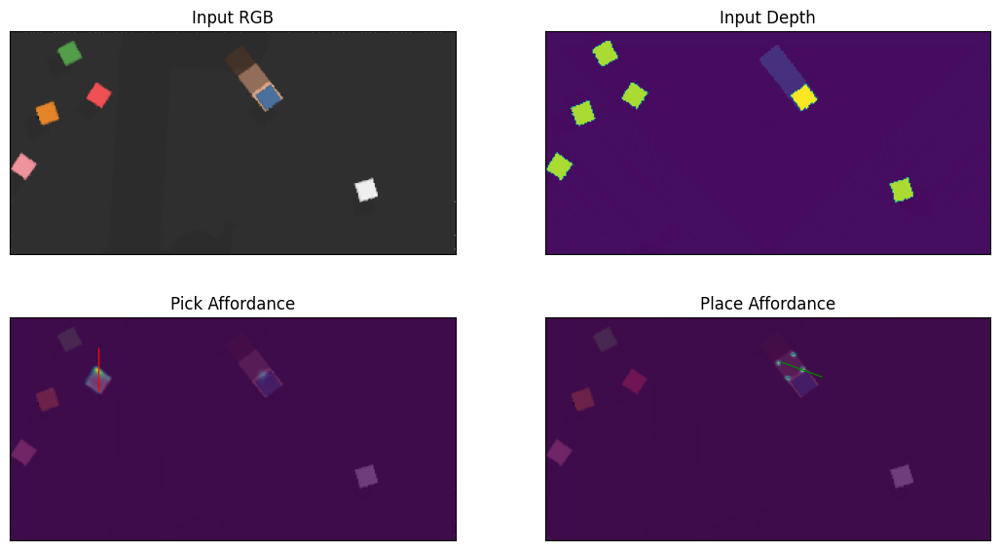

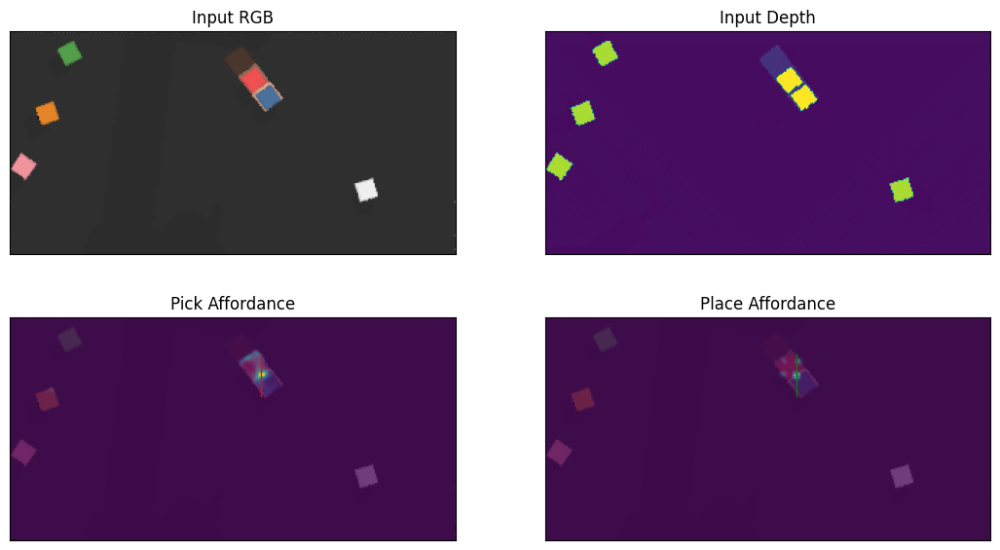

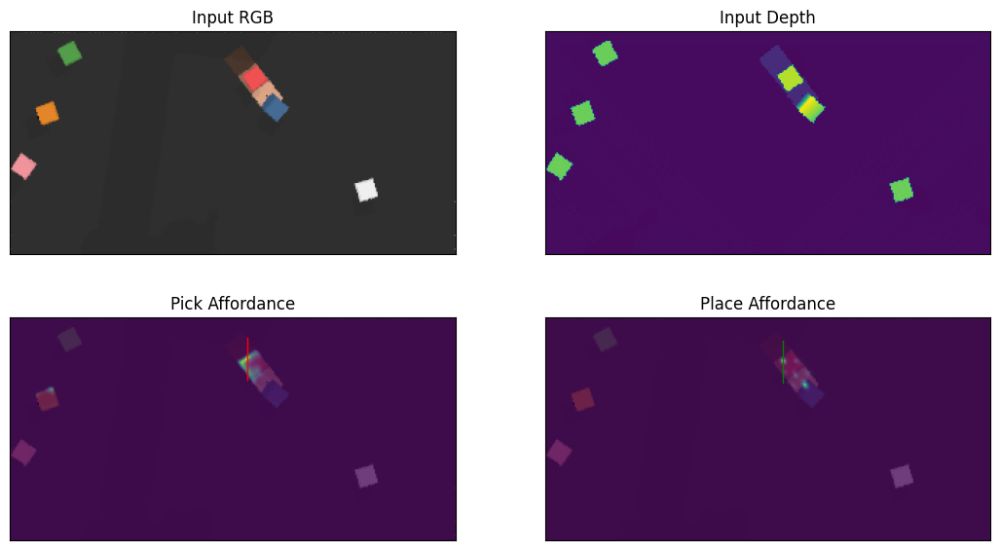

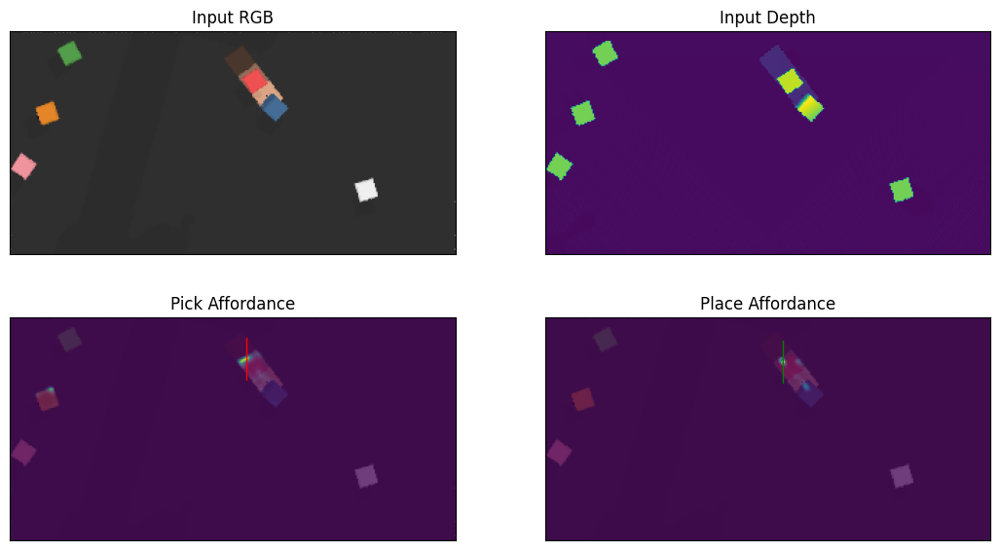

...

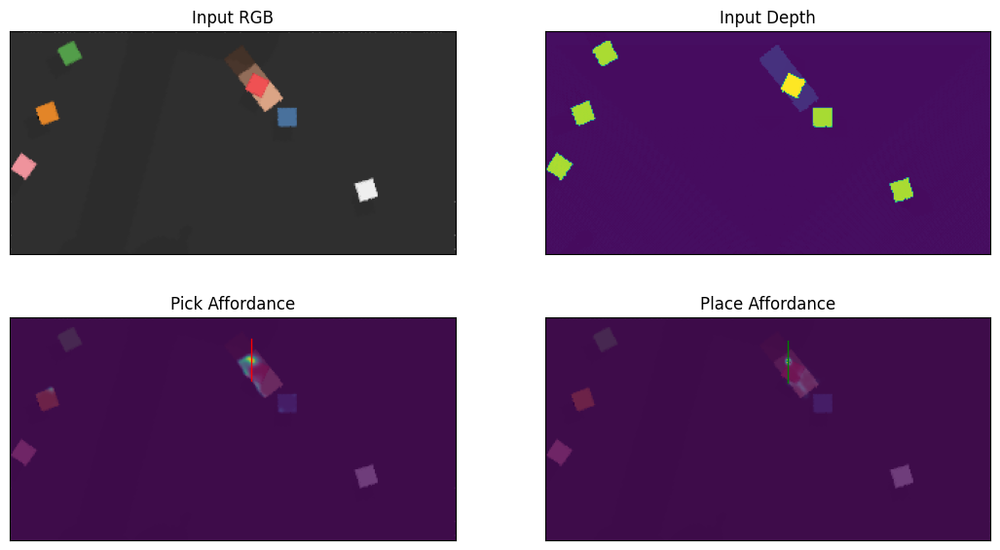

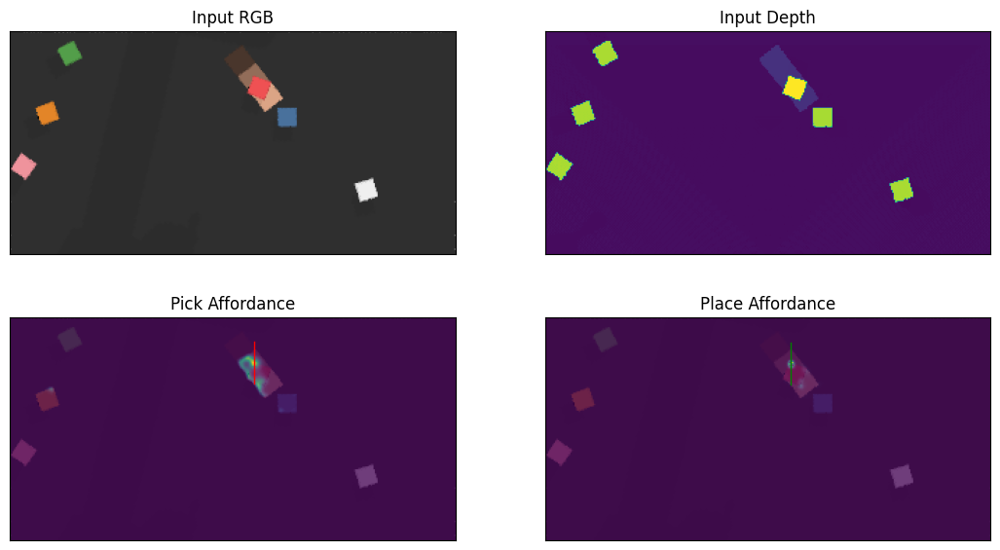

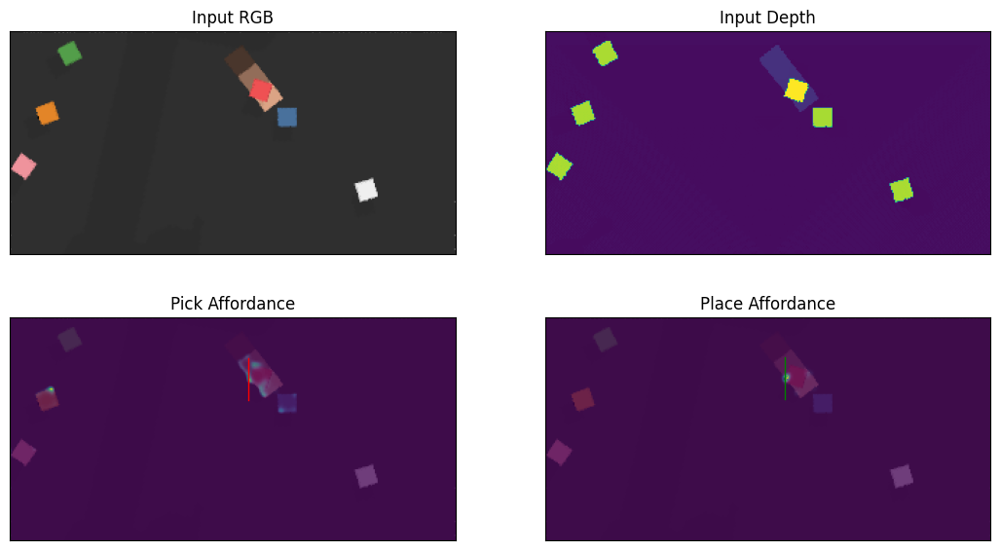

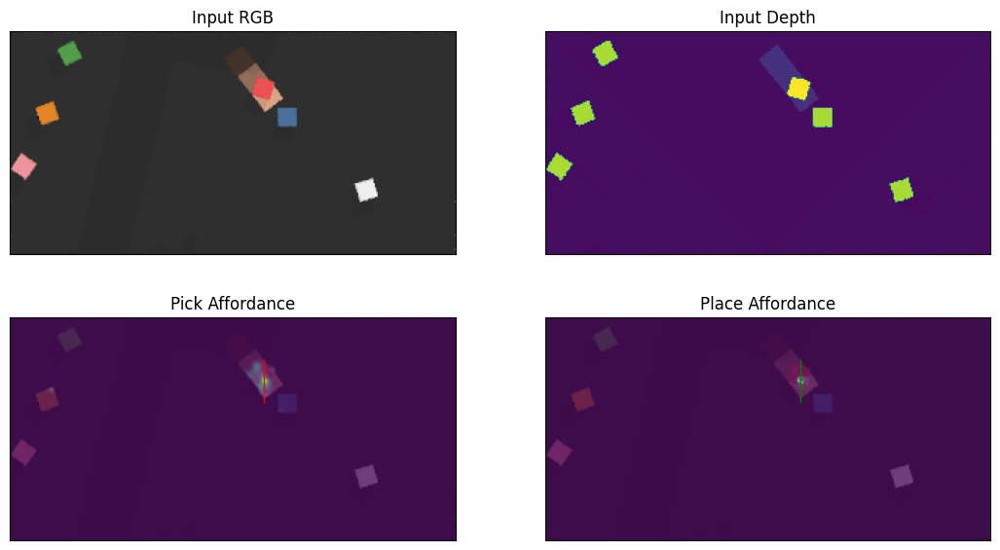

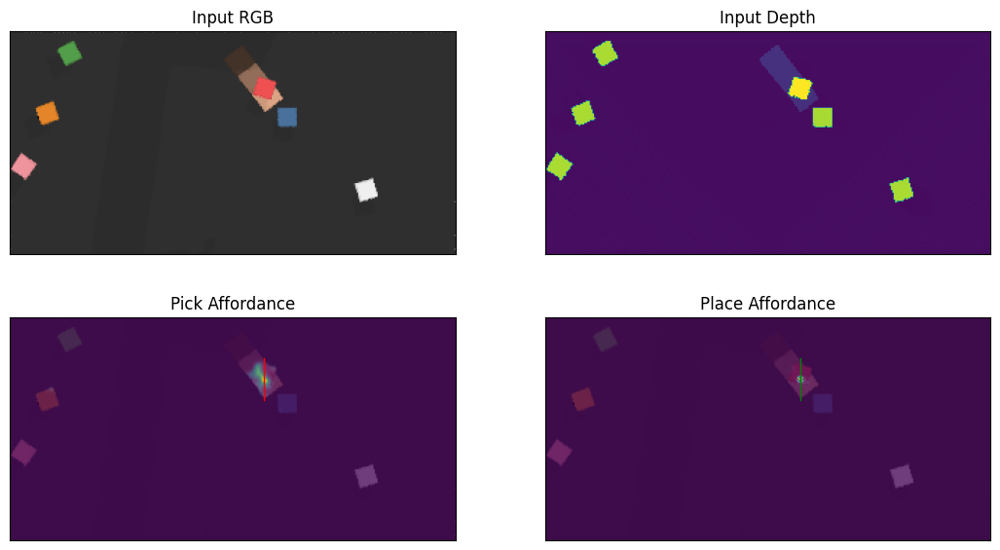

Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Lang Goal: put the pink block on the middle brown block
Max steps reached. Task failed.

Evaluation Instance: 6/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Goal: put the green block on the middle 

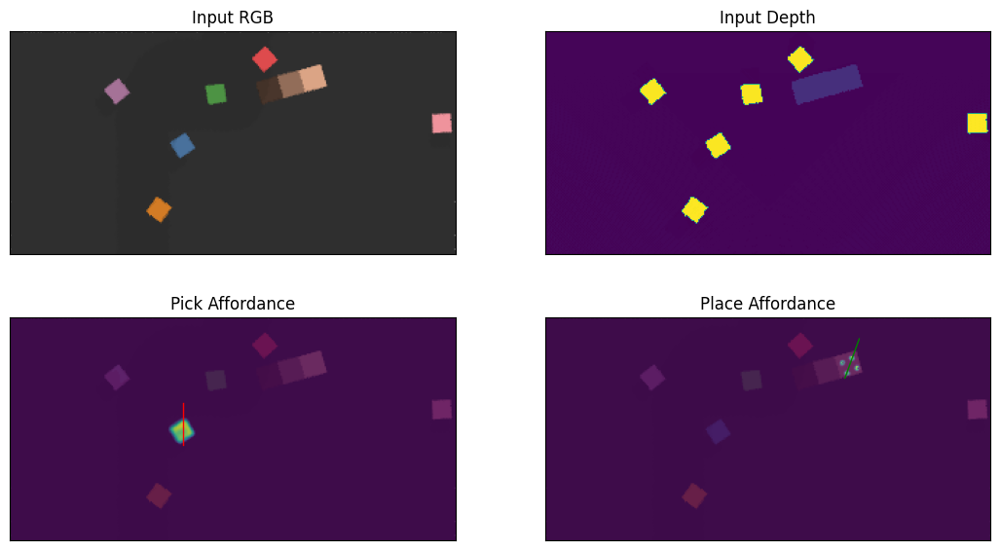

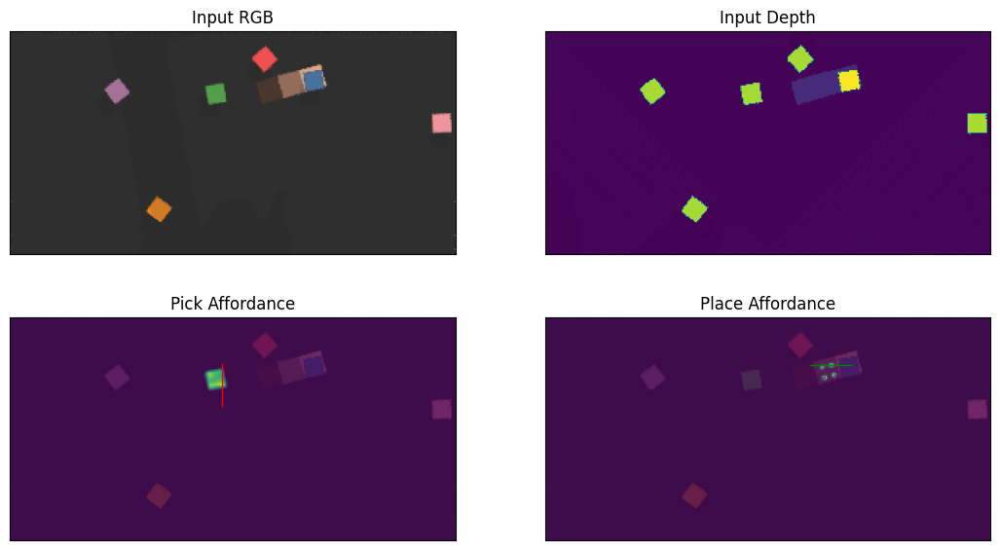

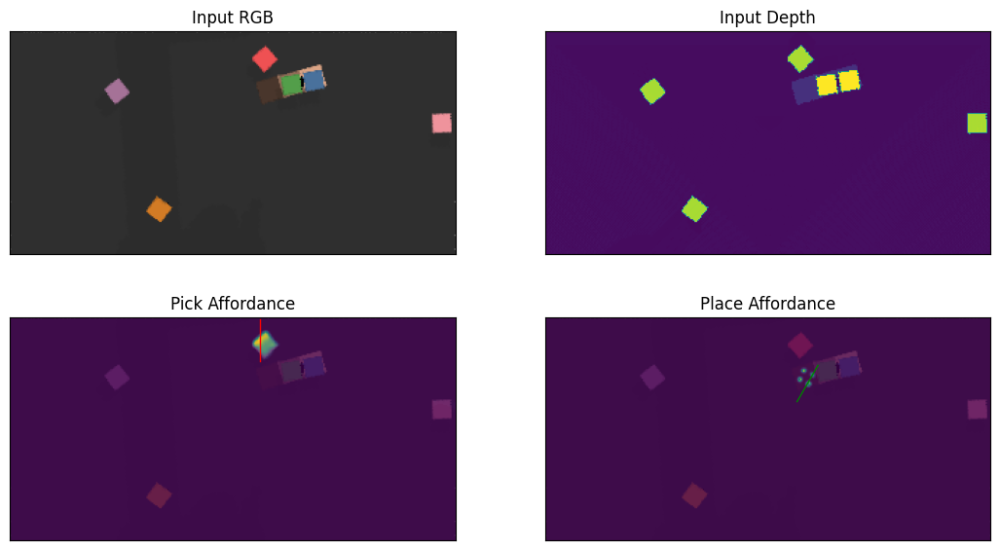

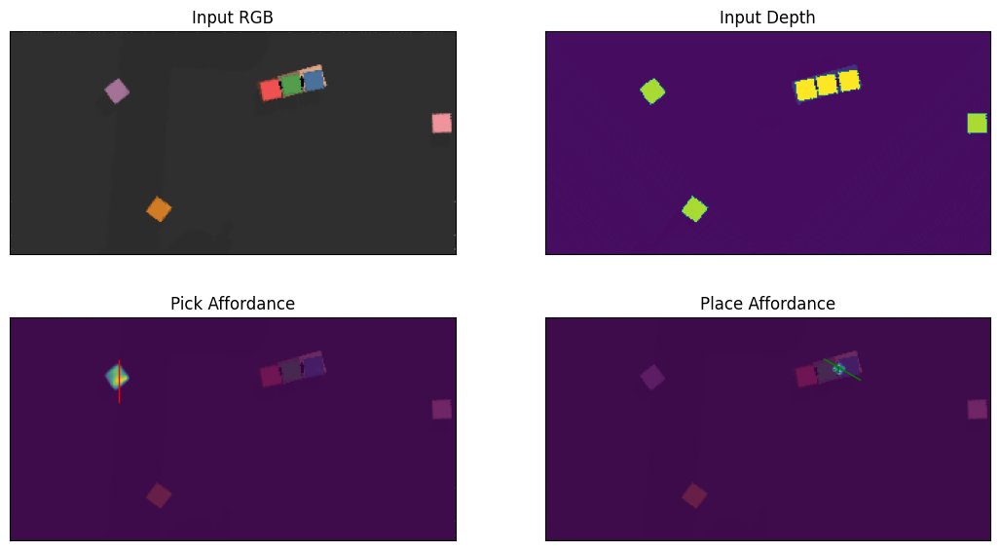

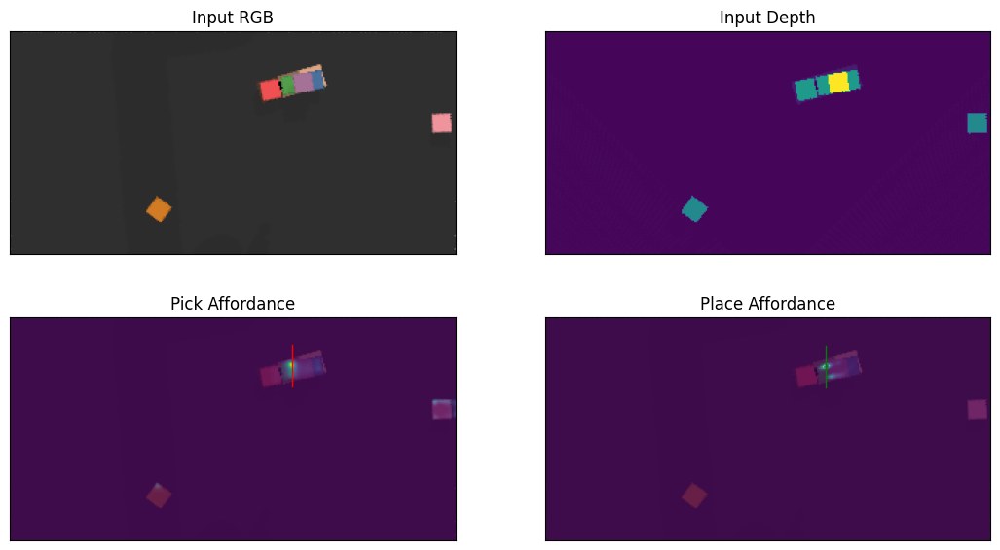

...

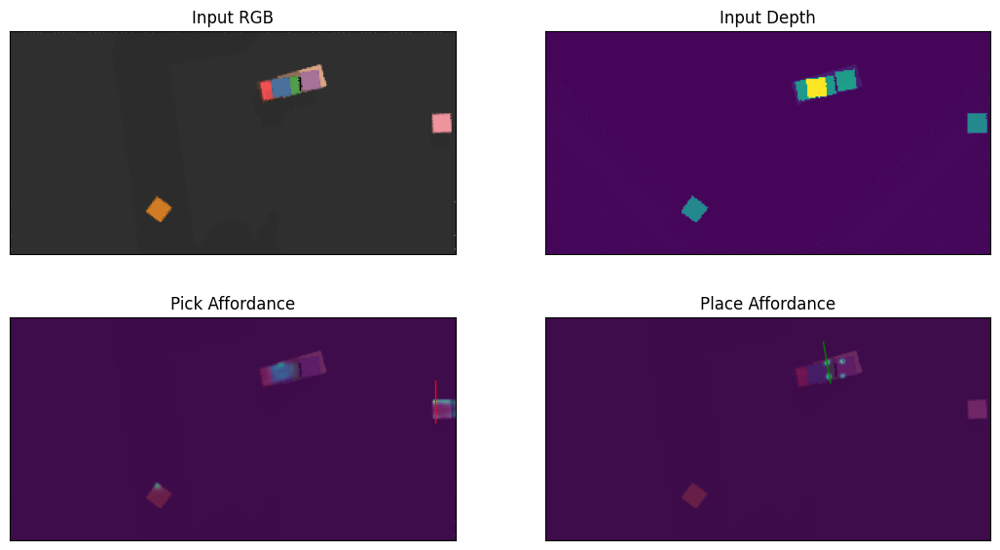

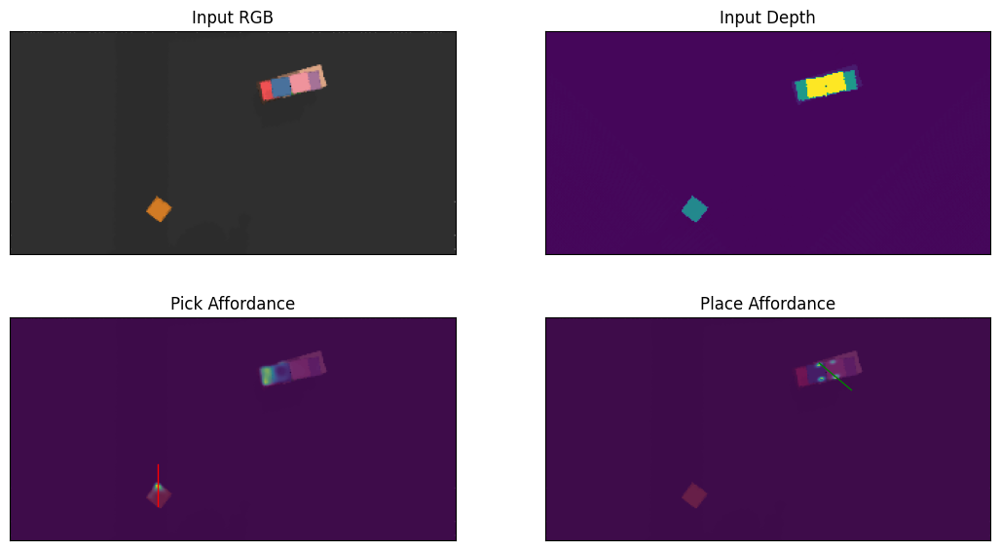

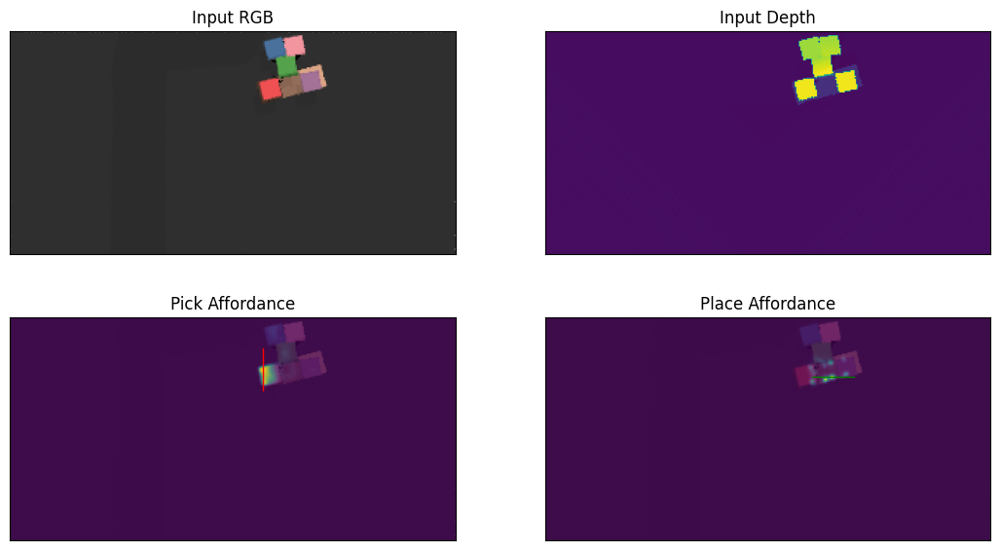

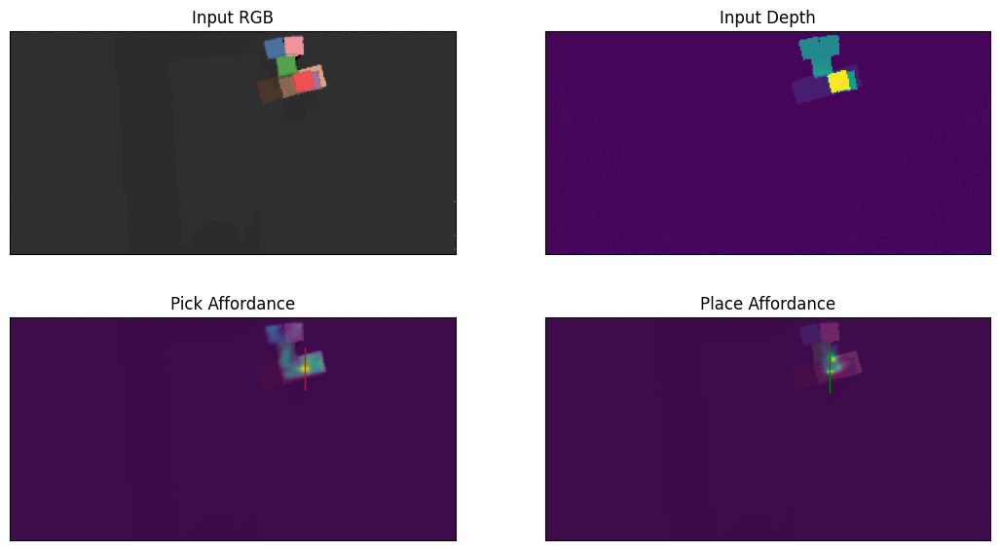

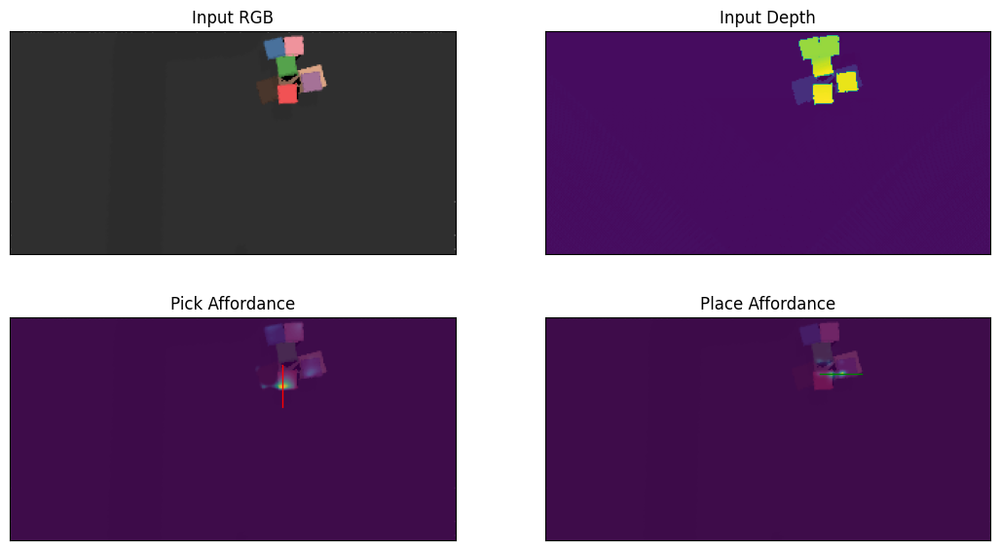

Lang Goal: put the red block on the darkest brown block
Lang Goal: put the pink block on the blue and green blocks
Lang Goal: put the pink block on the blue and green blocks
Lang Goal: put the pink block on the blue and green blocks
Lang Goal: put the pink block on the blue and green blocks
Lang Goal: put the pink block on the blue and green blocks
Lang Goal: put the pink block on the blue and green blocks
Lang Goal: put the purple block on the green and red blocks
Lang Goal: put the purple block on the green and red blocks
Lang Goal: put the purple block on the green and red blocks
Lang Goal: put the purple block on the green and red blocks
Lang Goal: put the purple block on the green and red blocks
Max steps reached. Task failed.

Evaluation Instance: 7/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Go

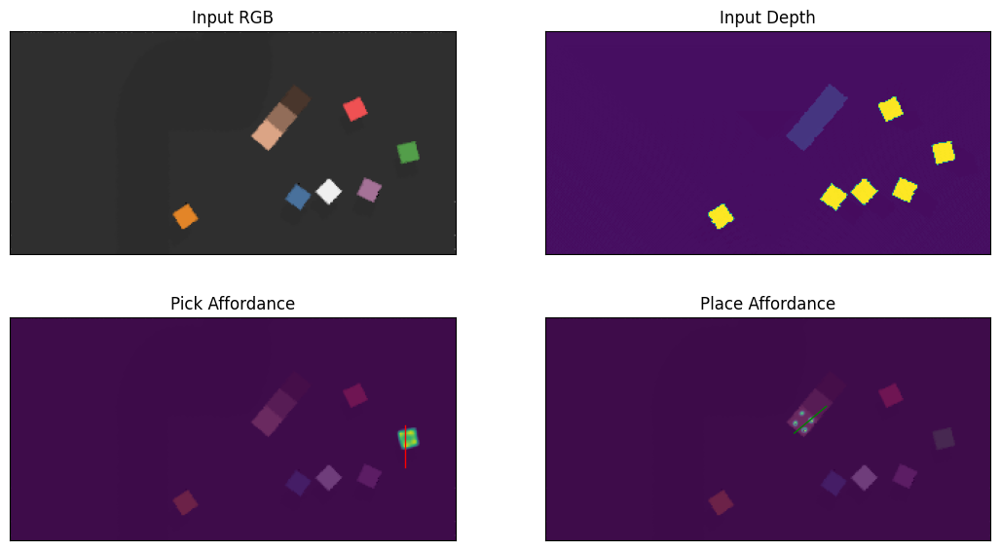

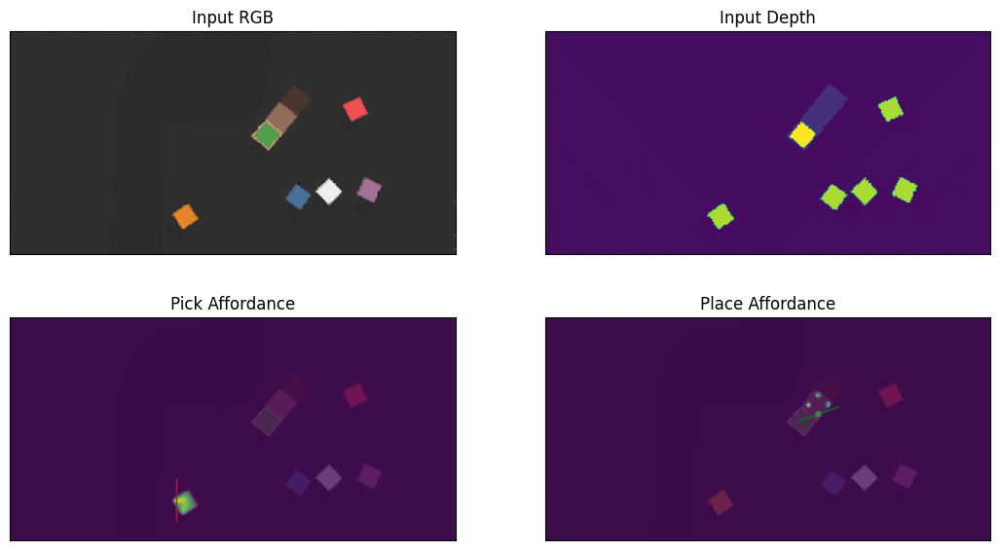

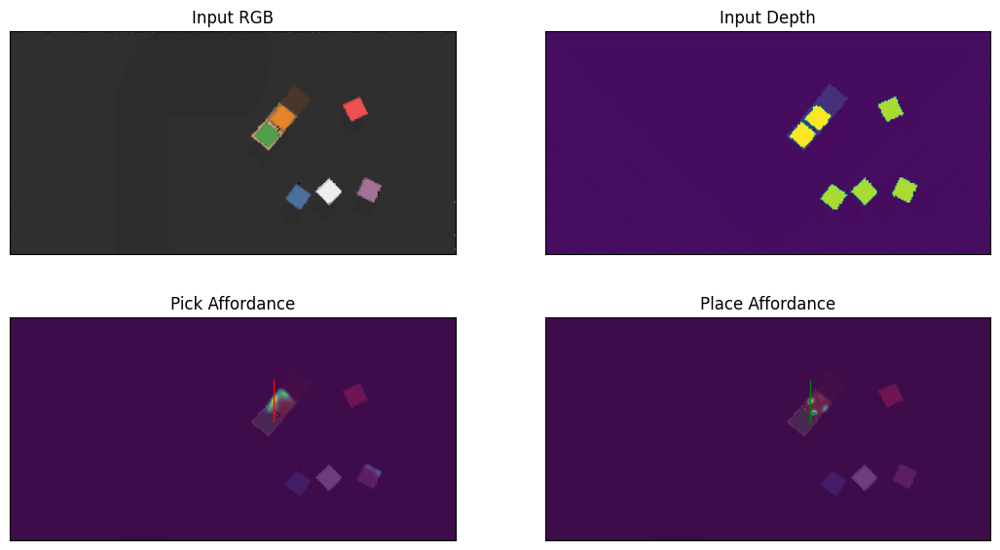

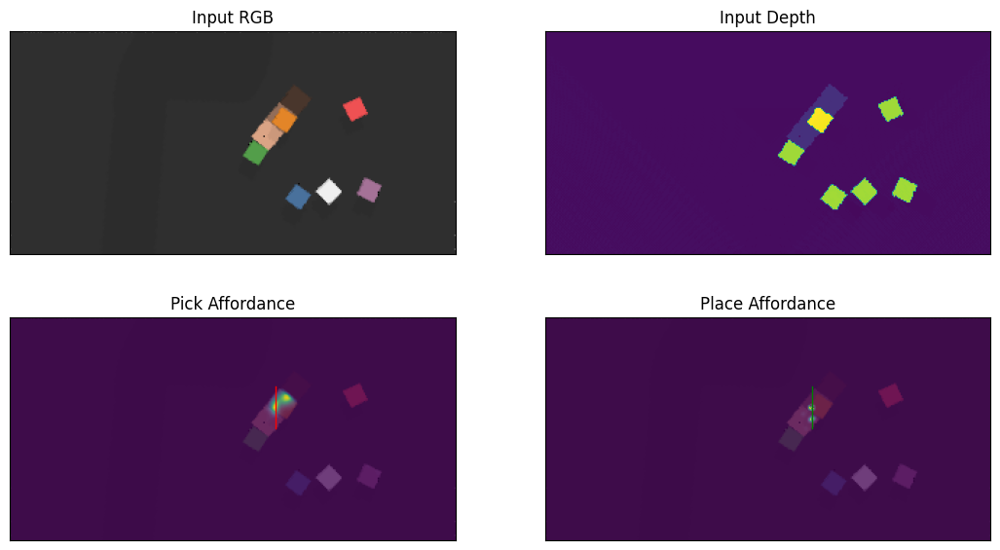

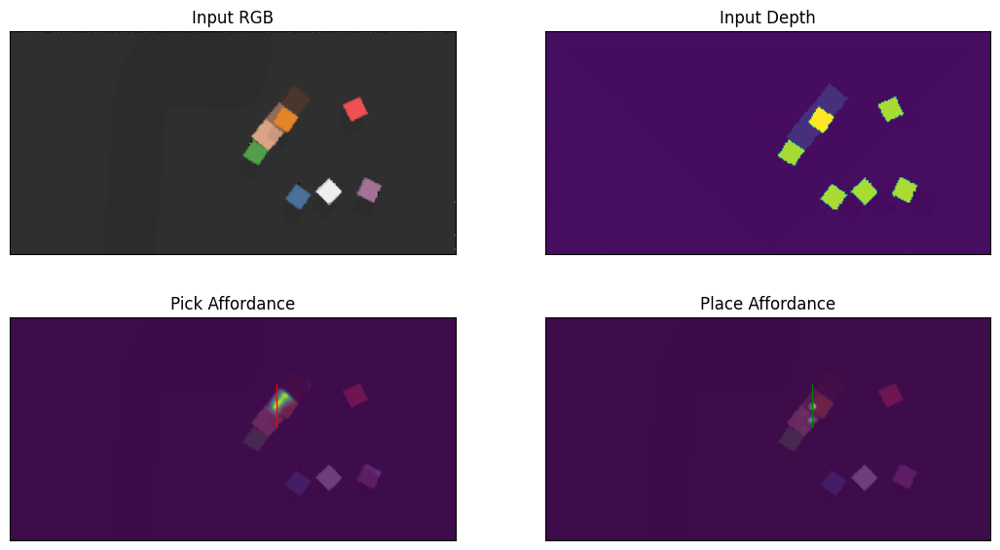

...

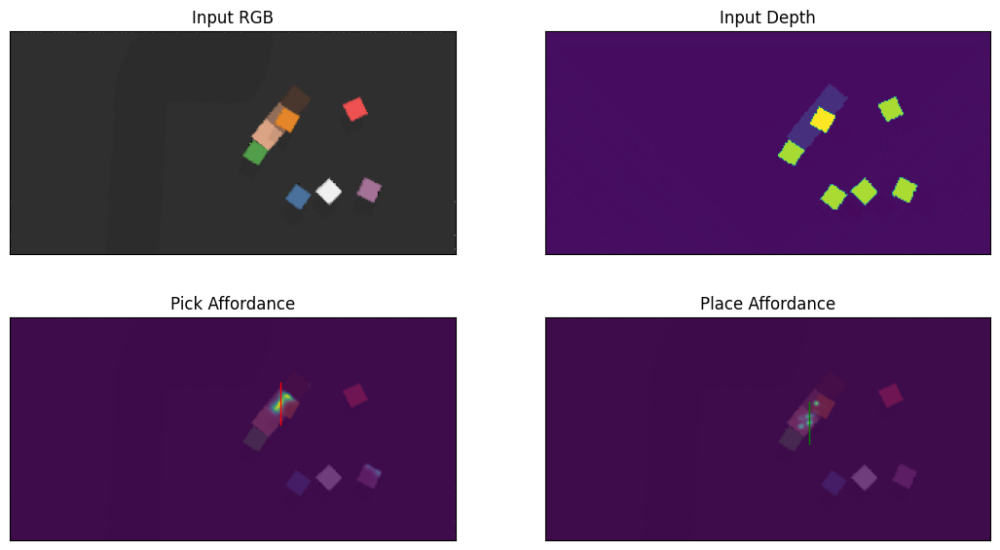

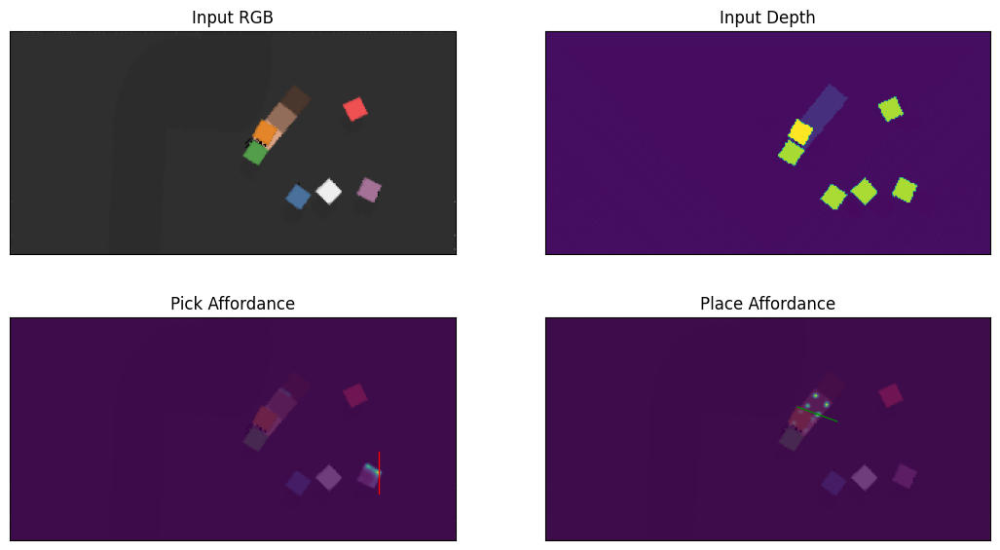

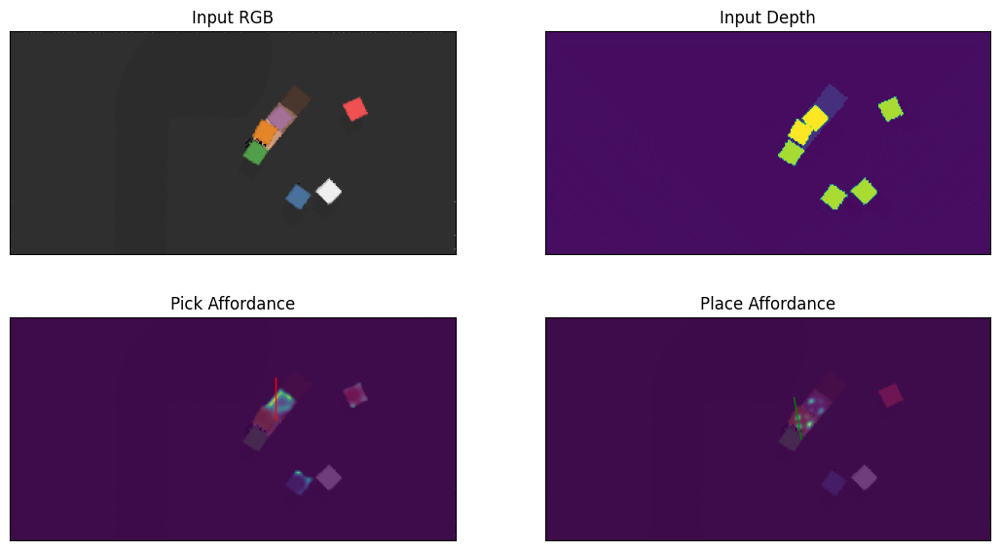

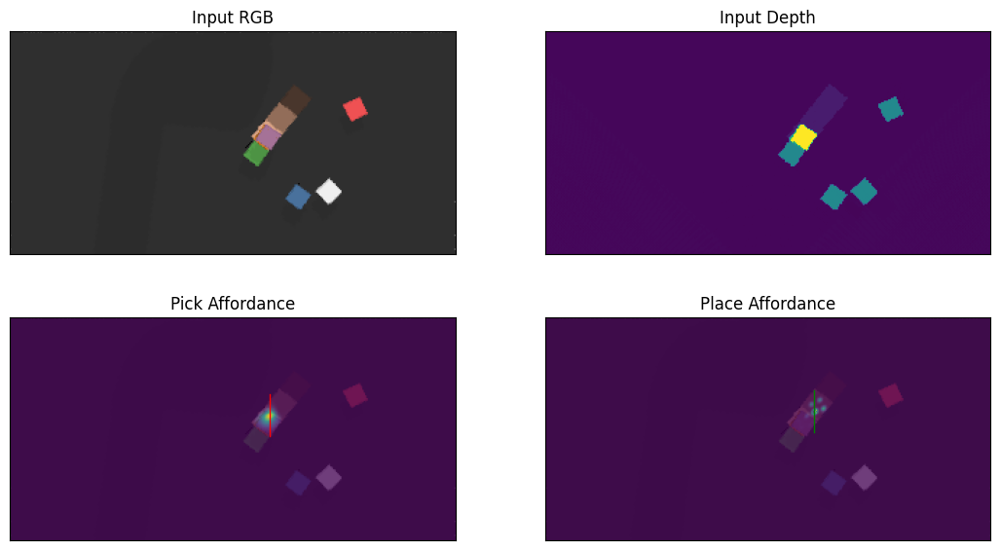

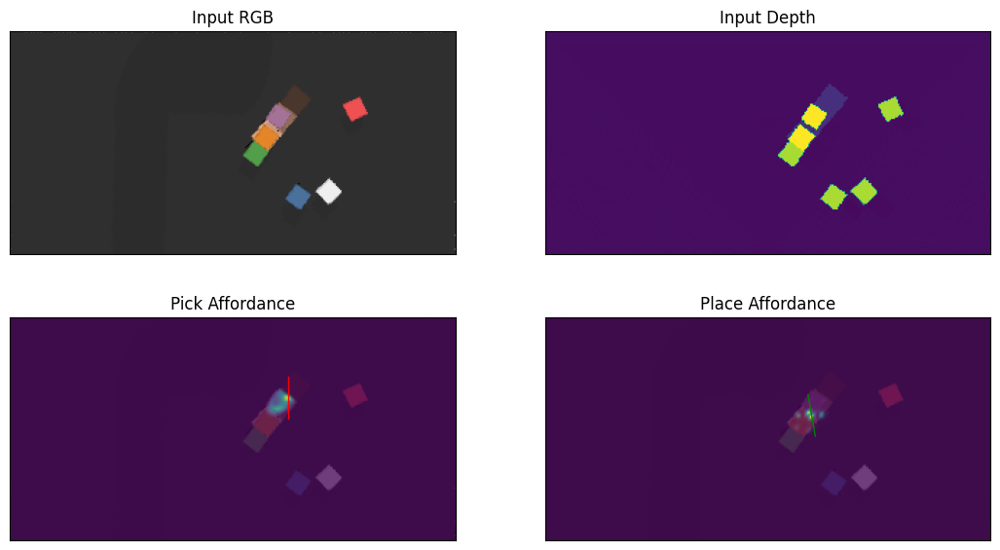

Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Max steps reached. Task failed.

Evaluation Instance: 8/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Goal: put the white block on

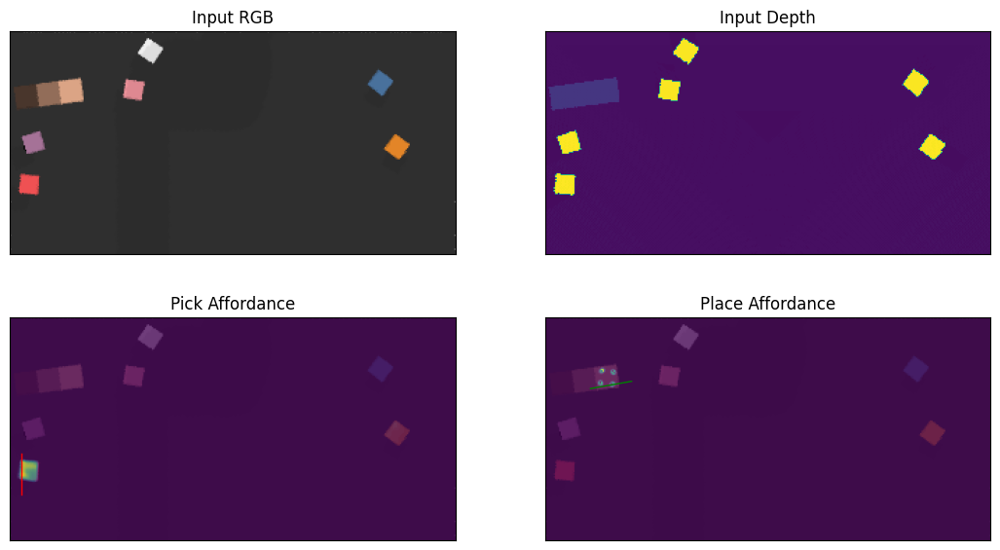

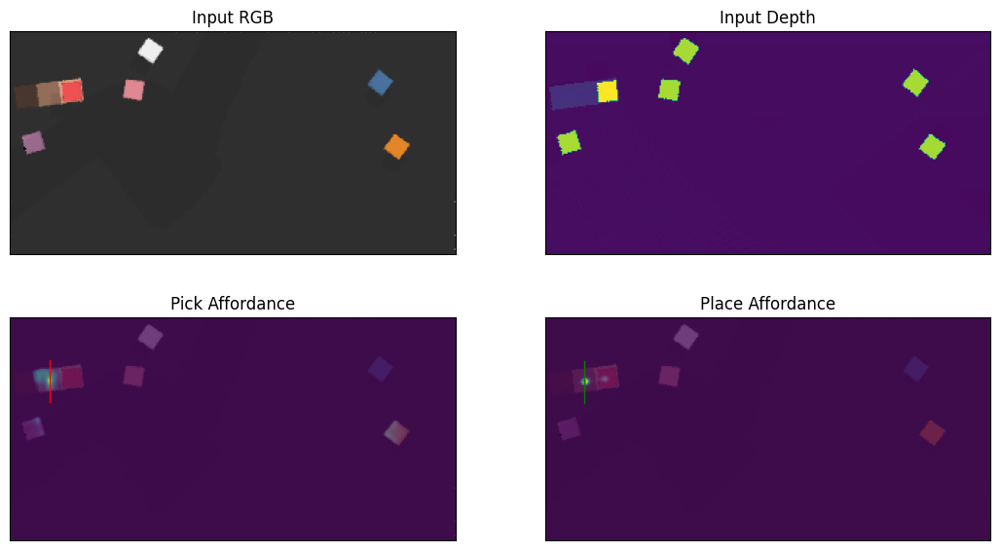

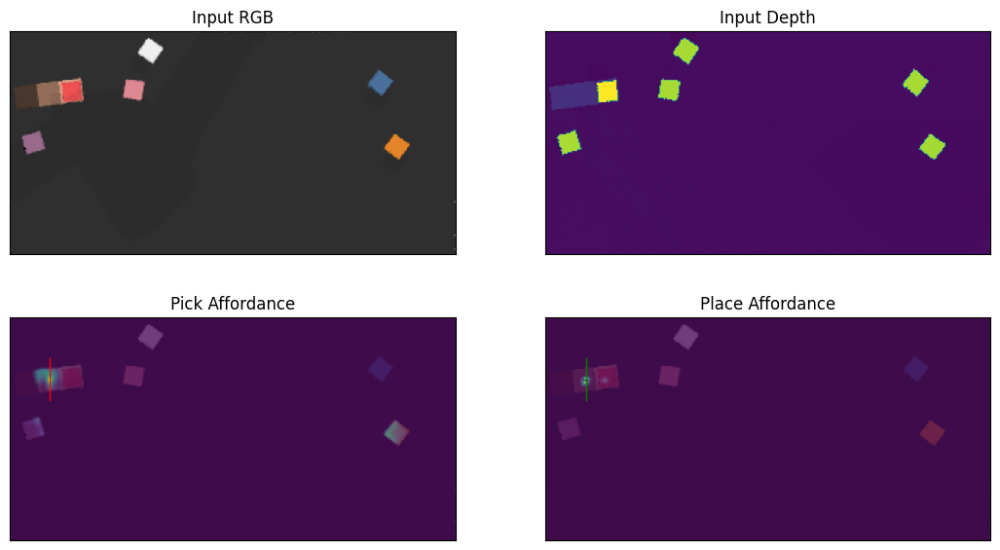

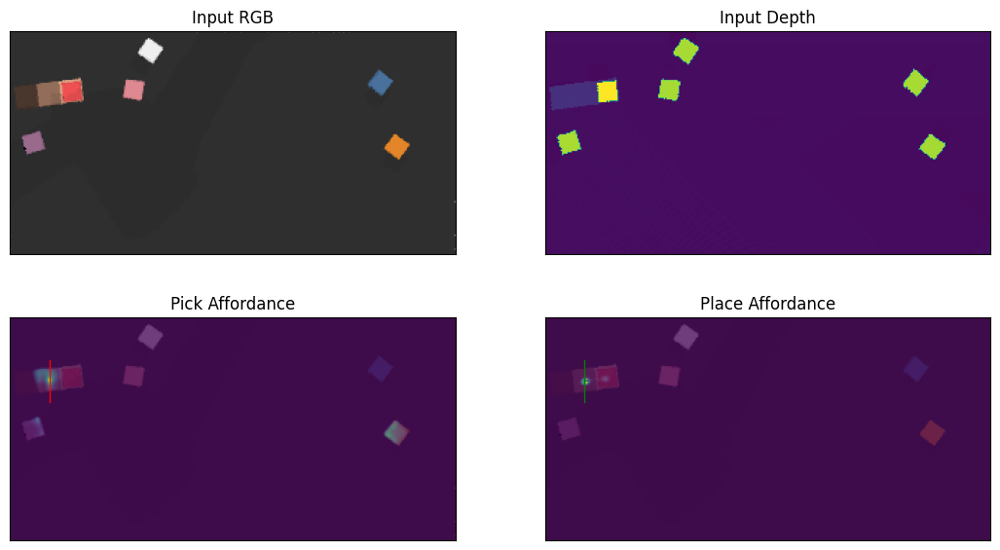

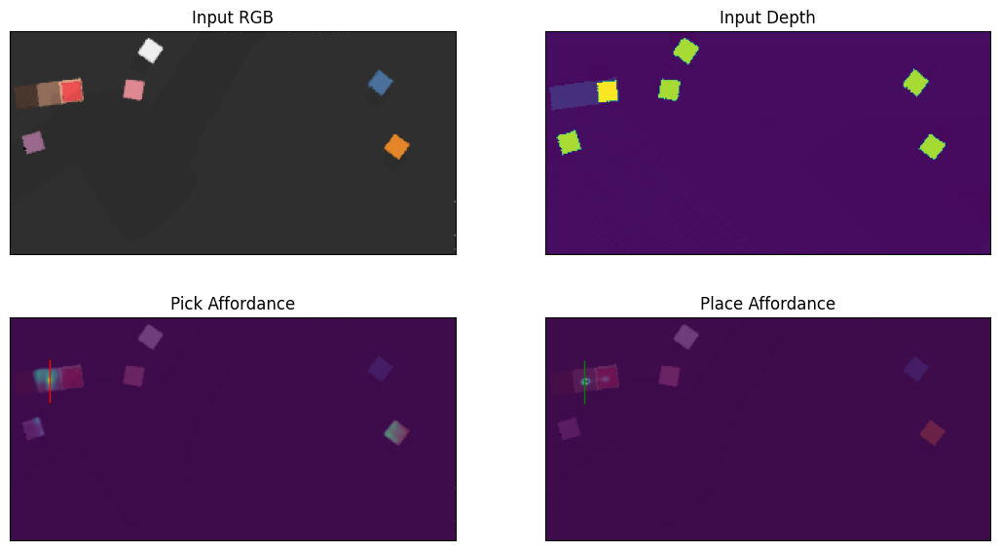

...

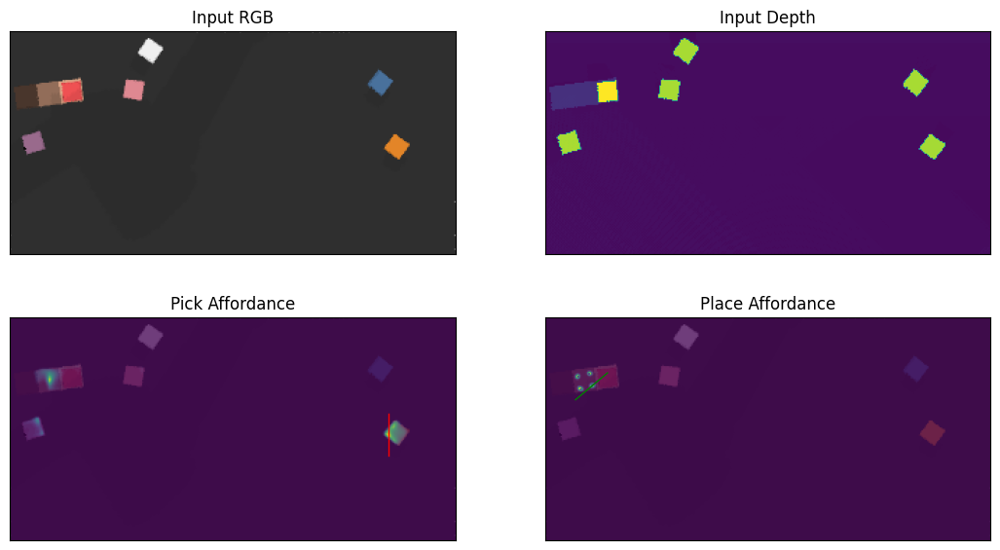

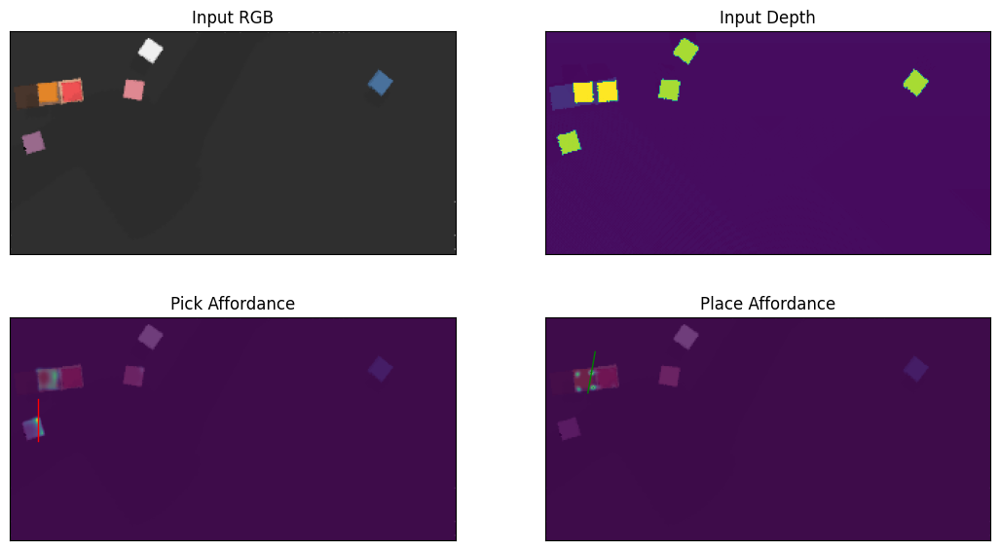

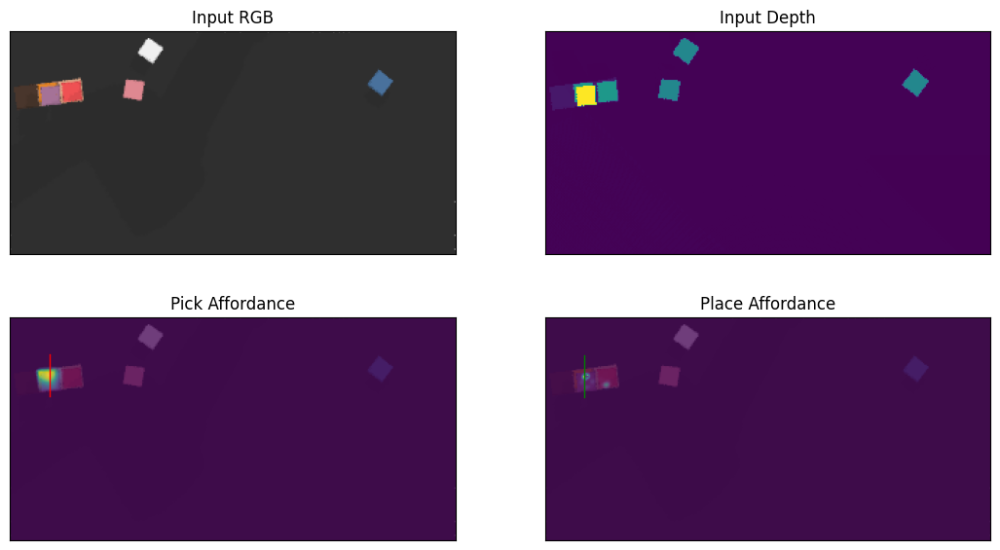

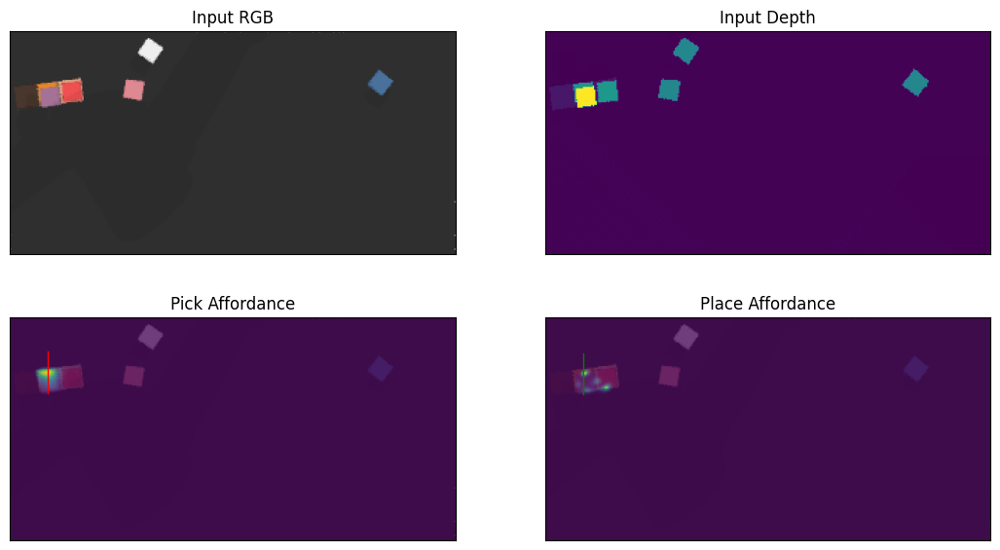

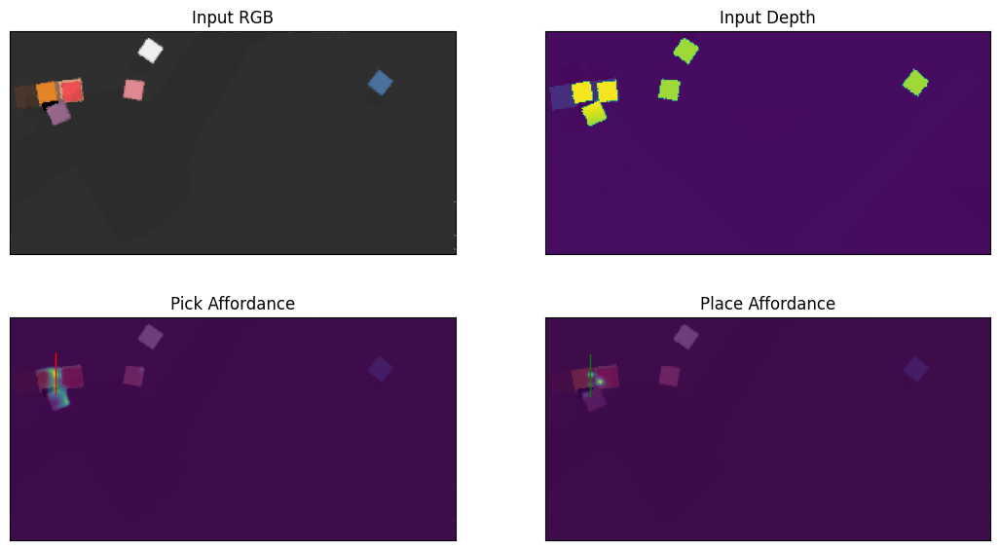

Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Lang Goal: put the white block on the middle brown block
Max steps reached. Task failed.

Evaluation Instance: 9/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Goal: put the red block on t

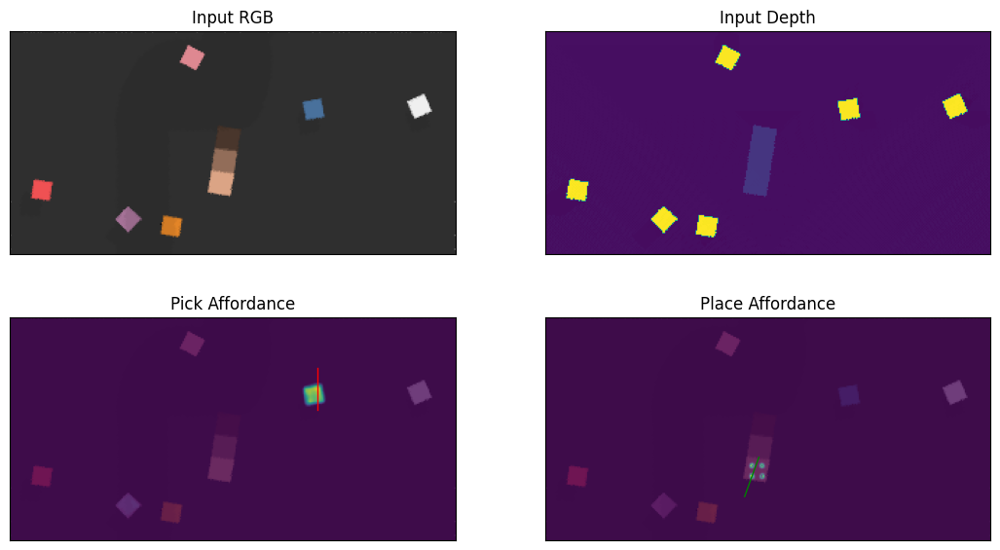

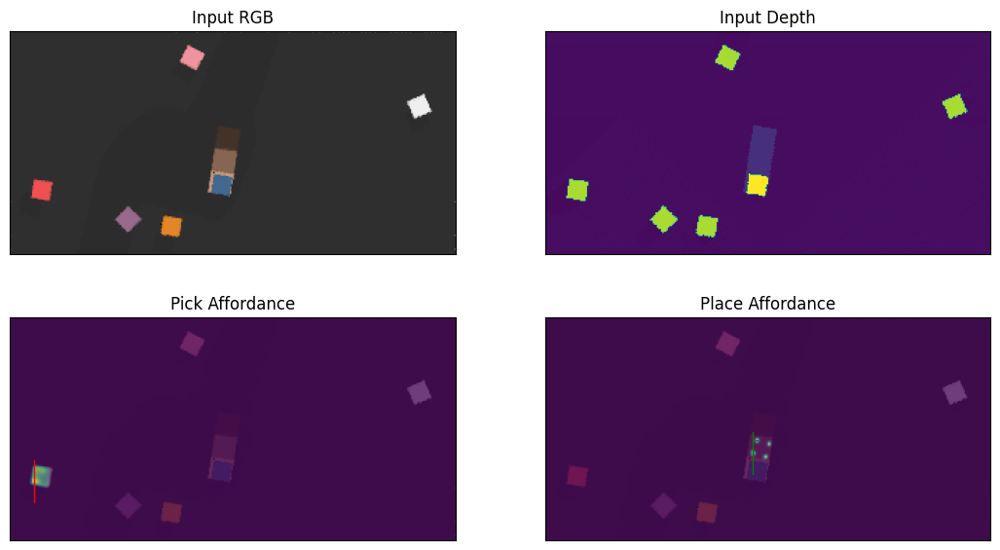

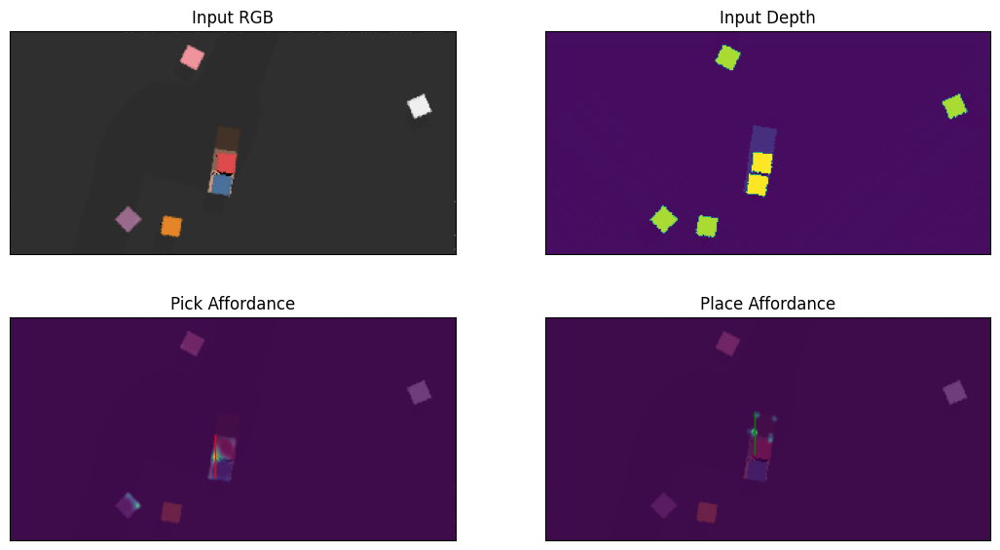

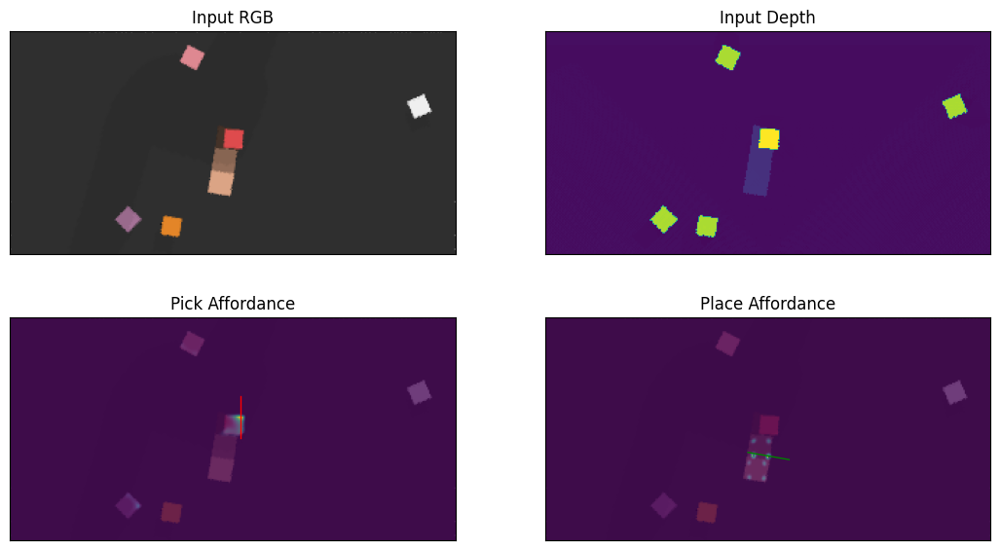

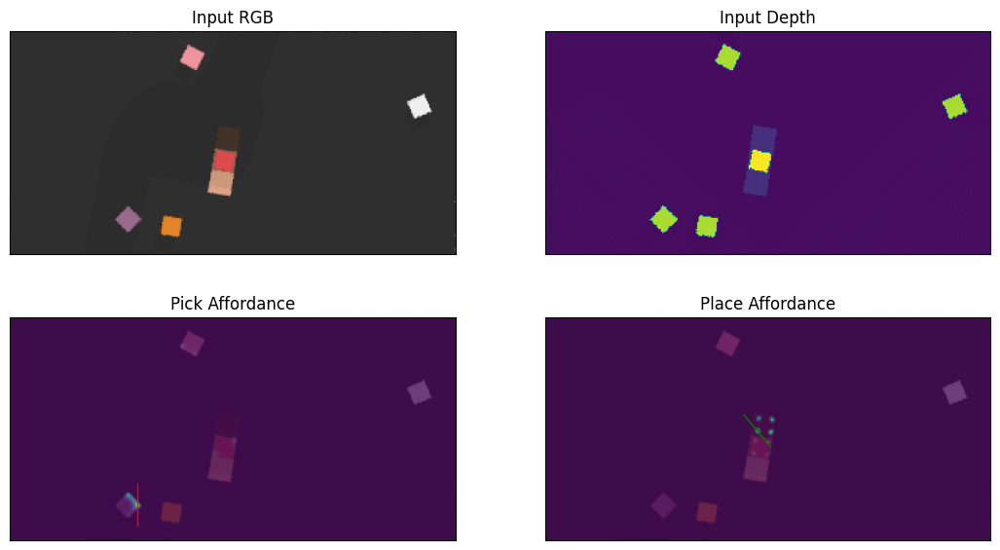

...

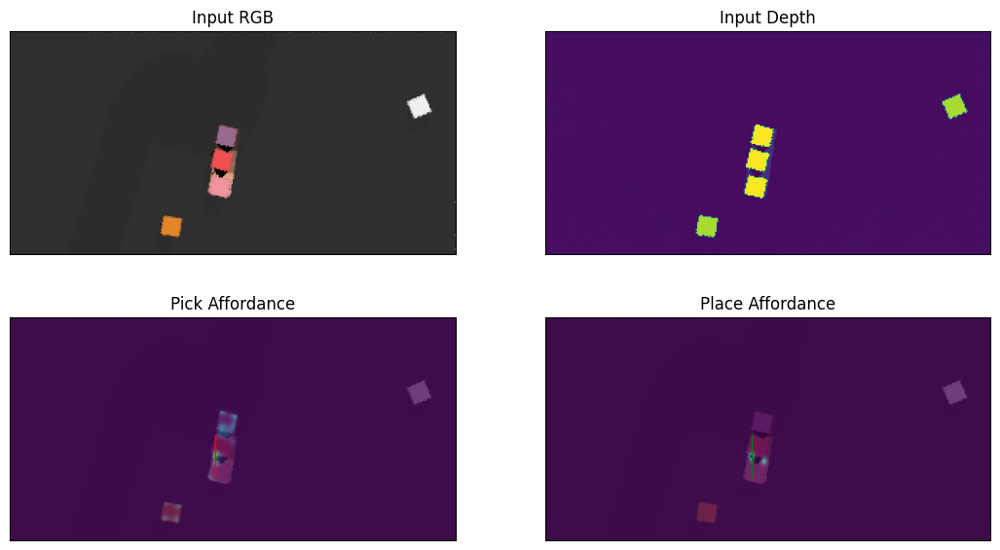

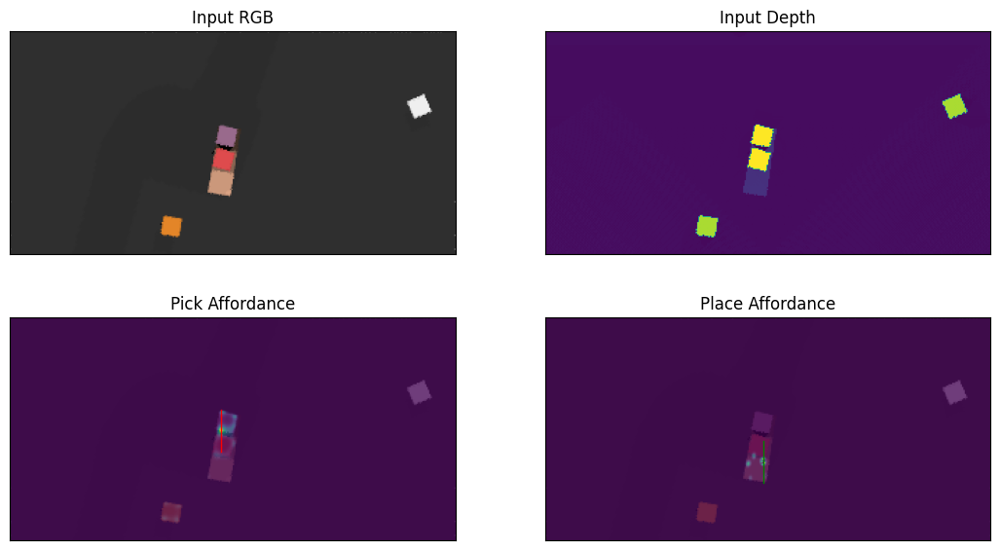

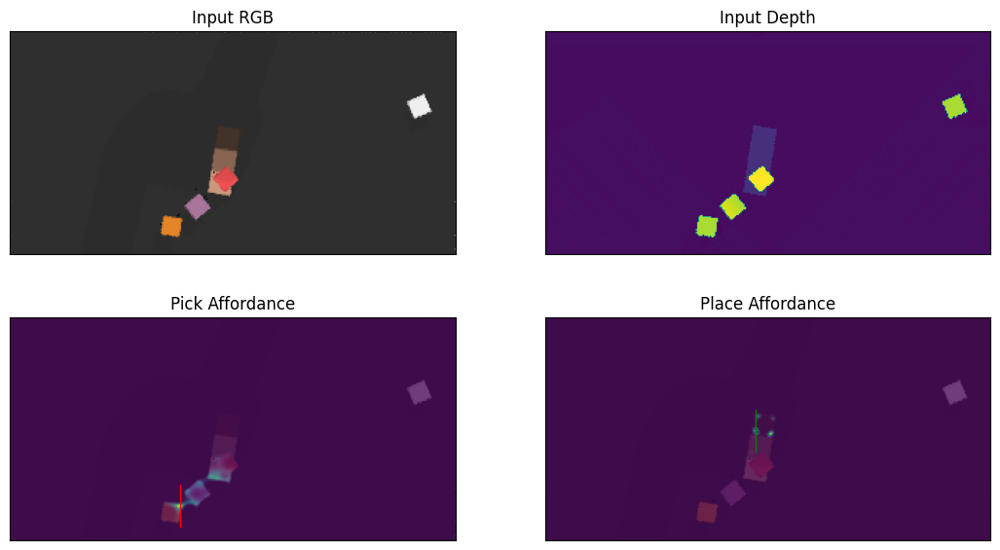

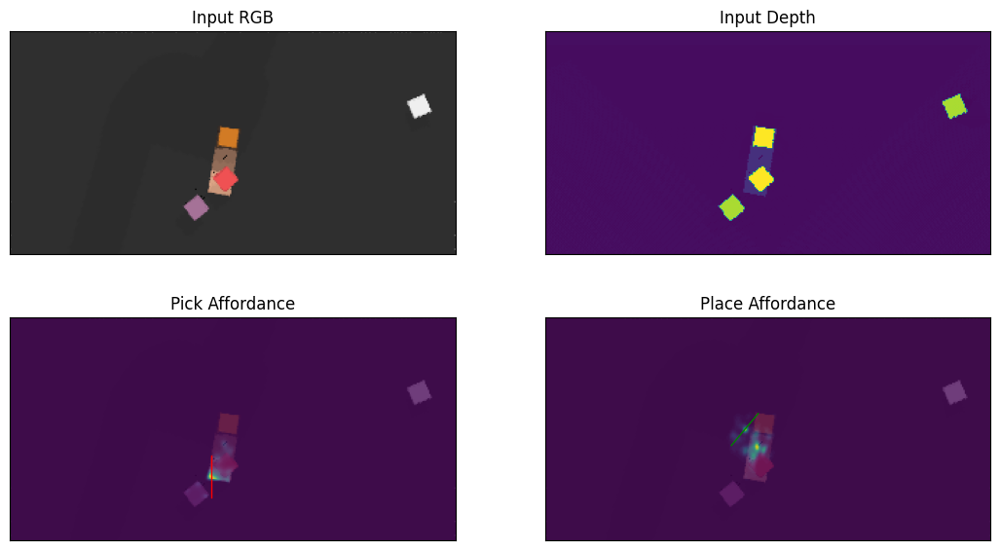

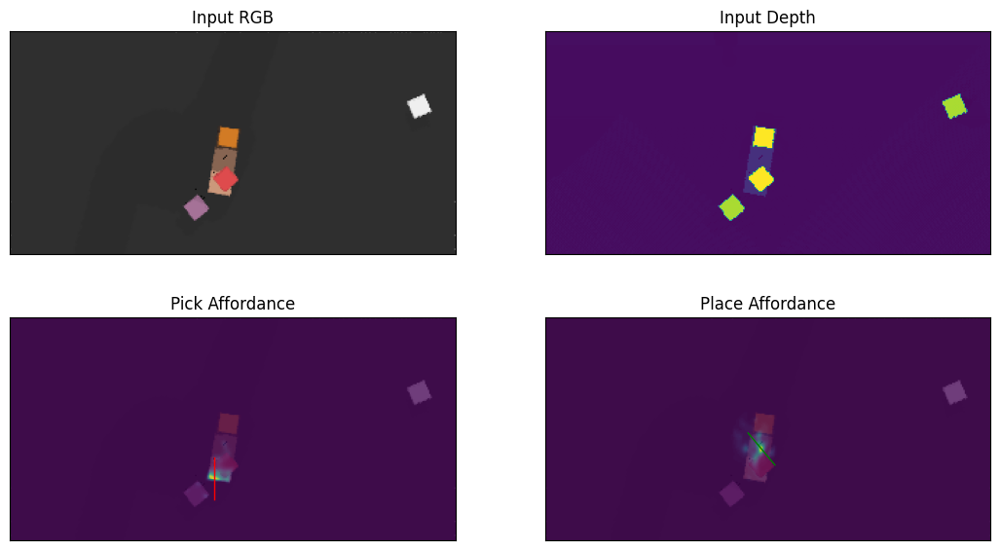

Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Lang Goal: put the pink block on the darkest brown block
Max steps reached. Task failed.

Evaluation Instance: 10/10
Step: 0 (12 max)
Step: 1 (12 max)
Step: 2 (12 max)
Step: 3 (12 max)
Step: 4 (12 max)
Step: 5 (12 max)
Step: 6 (12 max)
Step: 7 (12 max)
Step: 8 (12 max)
Step: 9 (12 max)
Step: 10 (12 max)
Step: 11 (12 max)
Step: 12 (12 max)
Lang Goal: put the pink block on

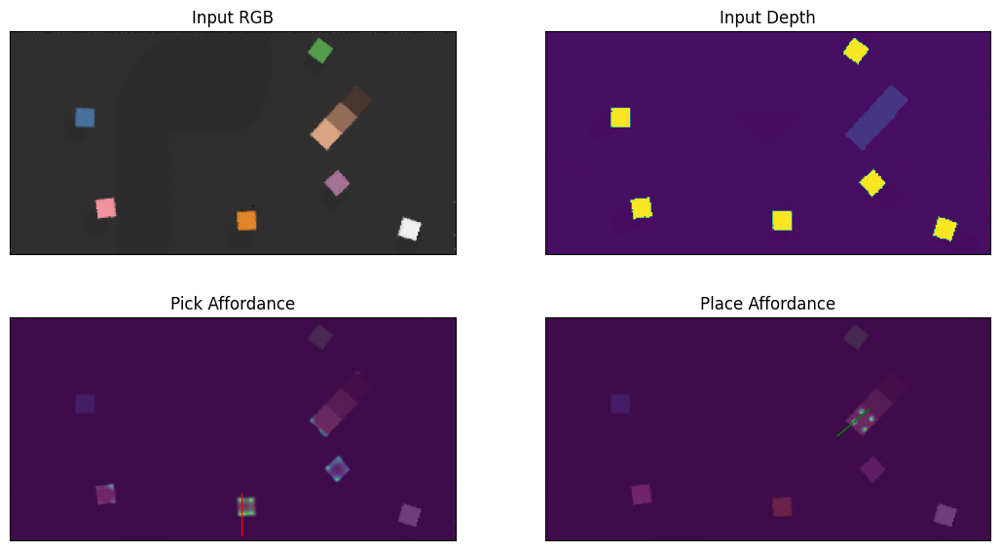

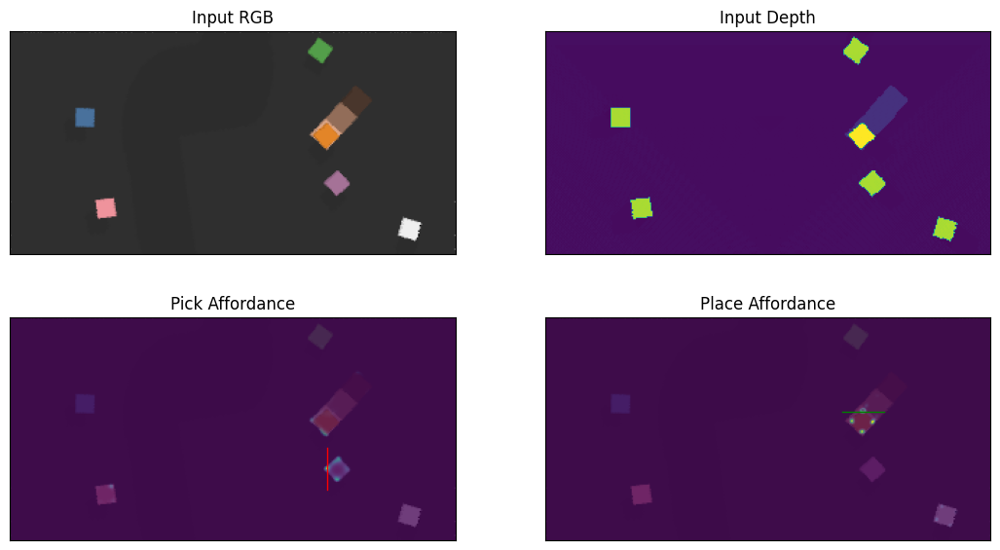

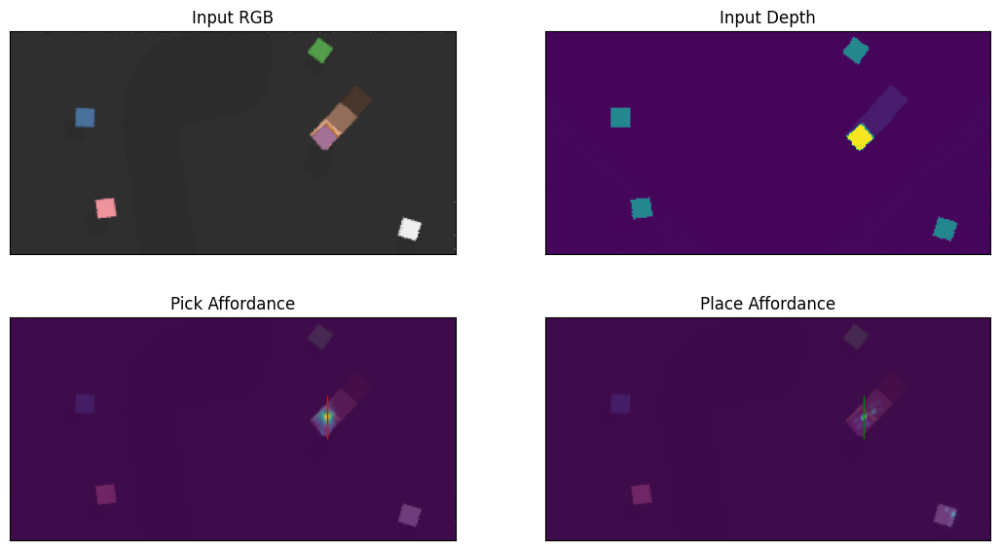

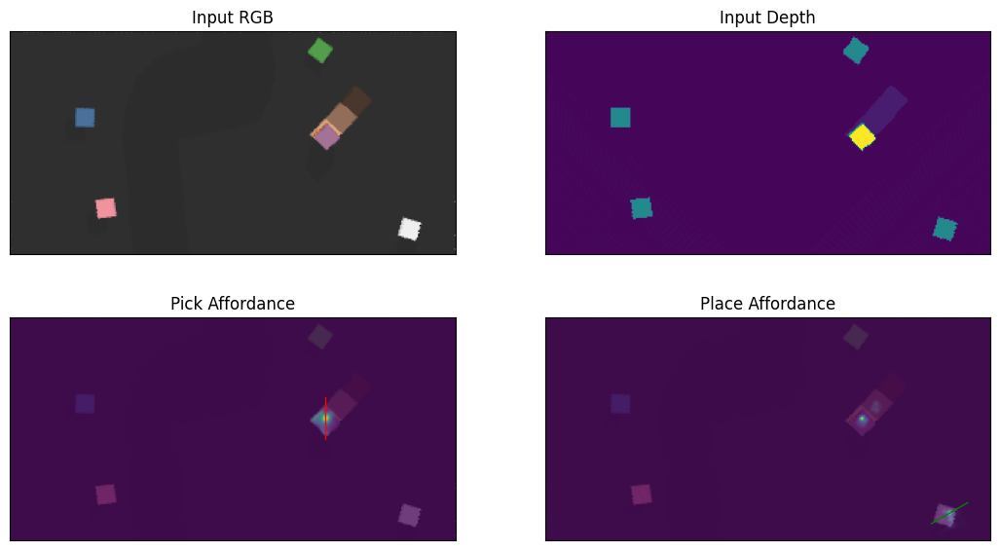

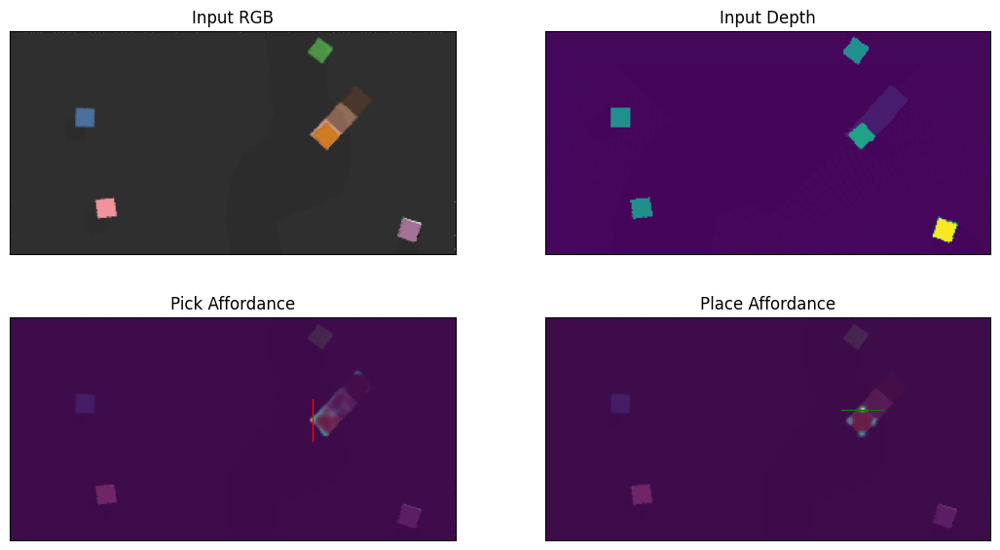

...

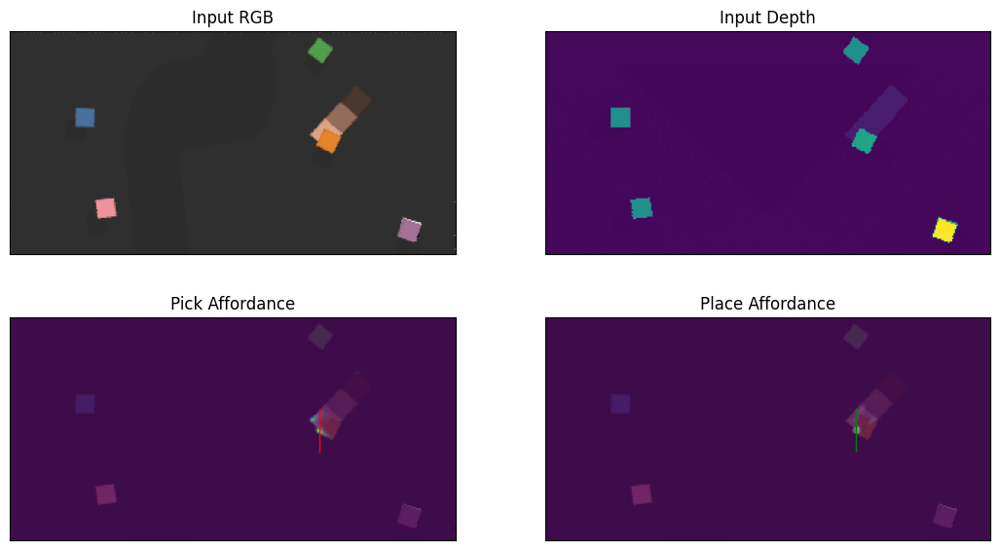

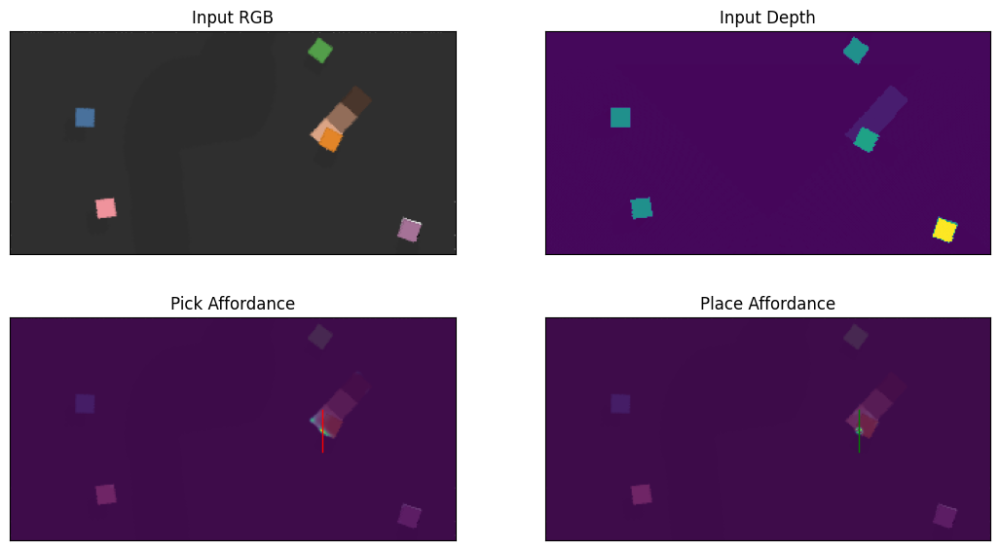

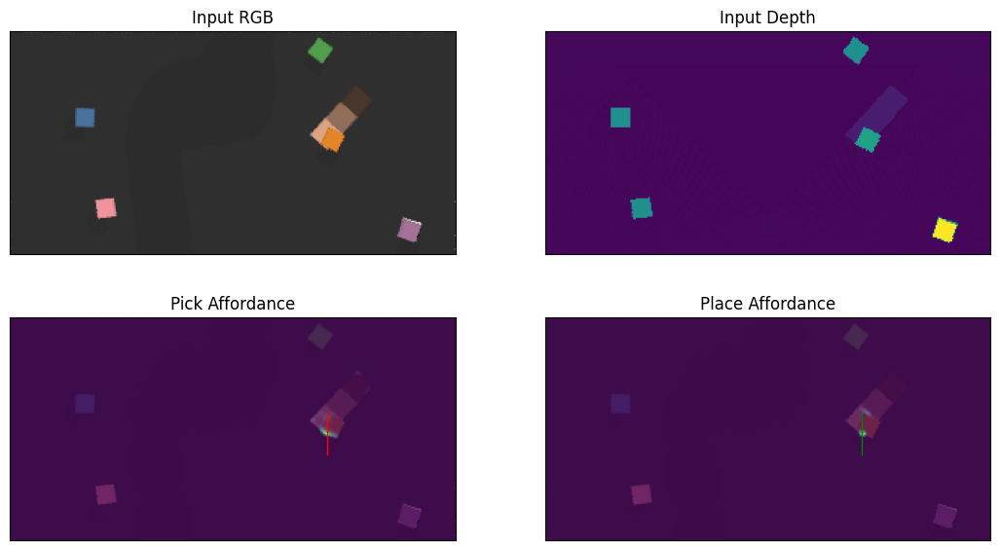

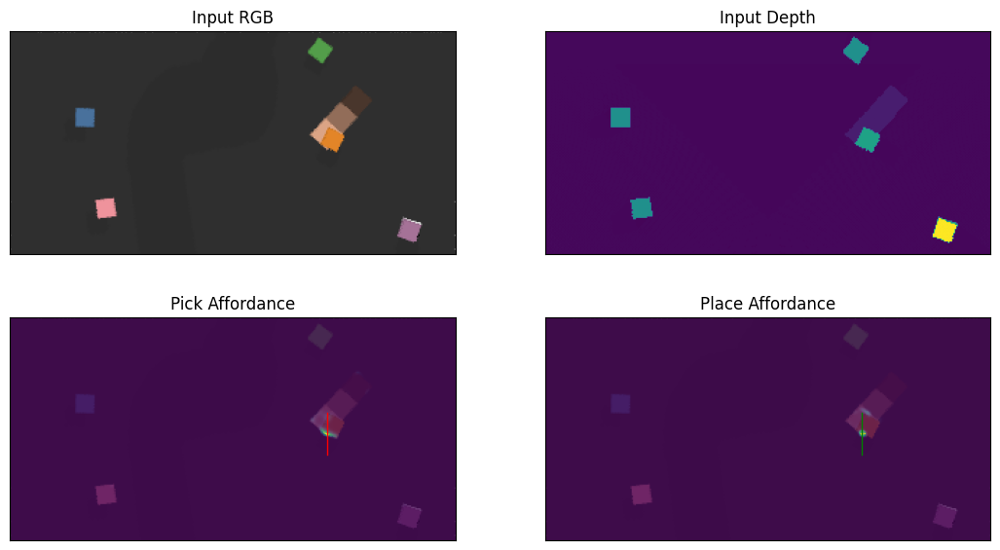

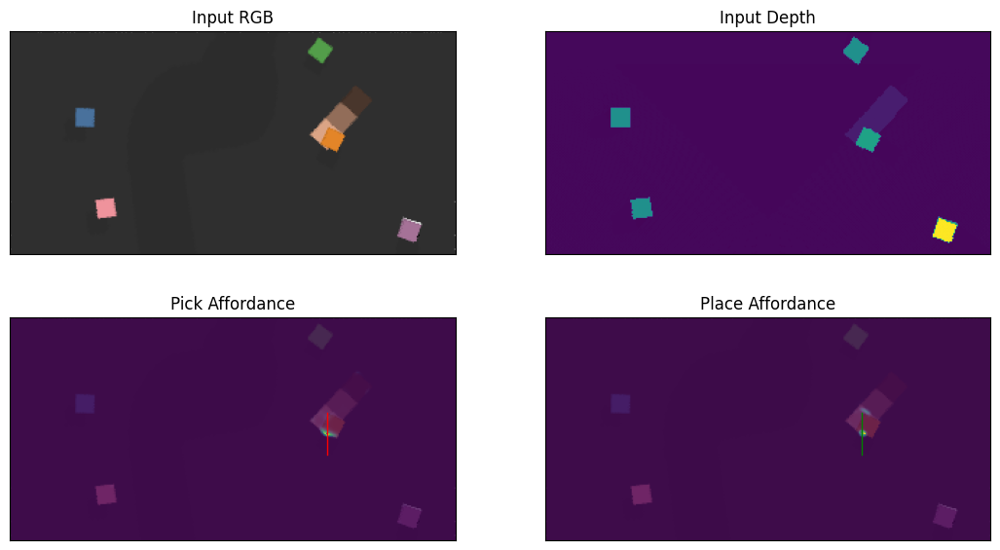

Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Lang Goal: put the pink block on the lightest brown block
Max steps reached. Task failed.


I0110 17:04:35.004364 139647109825728 internal.py:139] Internal process exited


: 

In [14]:
episode = 0
num_eval_instances = min(n_eval, ds.n_episodes)
num_eval_instances =10
for i in range(num_eval_instances):
    print(f'\nEvaluation Instance: {i + 1}/{num_eval_instances}')
    
    # Load episode
    episode, seed = ds.load(i)
    goal = episode[-1]
    total_reward = 0
    np.random.seed(seed)

    # Set task
    task_name = vcfg['eval_task']
    task = tasks.names[task_name]()
    task.mode = mode
    
    # Set environment
    env.seed(seed)
    env.set_task(task)
    obs = env.reset()
    info = env.info
    reward = 0
    
    step = 0
    done = False
    
    # Rollout

    buffered_outputs = []
    while (step <= task.max_steps) and not done:
        print(f"Step: {step} ({task.max_steps} max)")
        
        # Get batch
        if step == task.max_steps-1:
            batch = ds.process_goal((obs, None, reward, info), perturb_params=None)
        else:
            batch = ds.process_sample((obs, None, reward, info), augment=False)

        fig, axs = plt.subplots(2, 2, figsize=(13, 7))
        
        # Get color and depth inputs
        img = batch['img']
        img = torch.from_numpy(img)
        color = np.uint8(img.detach().cpu().numpy())[:,:,:3]
        color = color.transpose(1,0,2)
        depth = np.array(img.detach().cpu().numpy())[:,:,3]
        depth = depth.transpose(1,0)
        
        # Display input color
        axs[0,0].imshow(color)
        axs[0,0].axes.xaxis.set_visible(False)
        axs[0,0].axes.yaxis.set_visible(False)
        axs[0,0].set_title('Input RGB')
        
        # Display input depth
        axs[0,1].imshow(depth)
        axs[0,1].axes.xaxis.set_visible(False)
        axs[0,1].axes.yaxis.set_visible(False)        
        axs[0,1].set_title('Input Depth')
        
        # Display predicted pick affordance
        axs[1,0].imshow(color)
        axs[1,0].axes.xaxis.set_visible(False)
        axs[1,0].axes.yaxis.set_visible(False)
        axs[1,0].set_title('Pick Affordance')
        
        # Display predicted place affordance
        axs[1,1].imshow(color)
        axs[1,1].axes.xaxis.set_visible(False)
        axs[1,1].axes.yaxis.set_visible(False)
        axs[1,1].set_title('Place Affordance')
        
        # Get action predictions
        l = str(info['lang_goal'])
        act = agent.act(obs, info, goal=None)
        pick, place = act['pick'], act['place']
        
        # Visualize pick affordance
        pick_inp = {'inp_img': batch['img'], 'lang_goal': l}
        pick_conf = agent.attn_forward(pick_inp)
        logits = pick_conf.detach().cpu().numpy()

        pick_conf = pick_conf.detach().cpu().numpy()
        argmax = np.argmax(pick_conf)
        argmax = np.unravel_index(argmax, shape=pick_conf.shape)
        p0 = argmax[:2]
        p0_theta = (argmax[2] * (2 * np.pi / pick_conf.shape[2])) * -1.0
    
        line_len = 30
        pick0 = (pick[0] + line_len/2.0 * np.sin(p0_theta), pick[1] + line_len/2.0 * np.cos(p0_theta))
        pick1 = (pick[0] - line_len/2.0 * np.sin(p0_theta), pick[1] - line_len/2.0 * np.cos(p0_theta))

        if draw_grasp_lines:
            axs[1,0].plot((pick1[0], pick0[0]), (pick1[1], pick0[1]), color='r', linewidth=1)
        
        # Visualize place affordance
        place_inp = {'inp_img': batch['img'], 'p0': pick, 'lang_goal': l}
        place_conf = agent.trans_forward(place_inp)

        place_conf = place_conf.permute(1, 2, 0)
        place_conf = place_conf.detach().cpu().numpy()
        argmax = np.argmax(place_conf)
        argmax = np.unravel_index(argmax, shape=place_conf.shape)
        p1_pix = argmax[:2]
        p1_theta = (argmax[2] * (2 * np.pi / place_conf.shape[2]) + p0_theta) * -1.0
        
        line_len = 30
        place0 = (place[0] + line_len/2.0 * np.sin(p1_theta), place[1] + line_len/2.0 * np.cos(p1_theta))
        place1 = (place[0] - line_len/2.0 * np.sin(p1_theta), place[1] - line_len/2.0 * np.cos(p1_theta))

        if draw_grasp_lines:
            axs[1,1].plot((place1[0], place0[0]), (place1[1], place0[1]), color='g', linewidth=1)
        
        # Overlay affordances on RGB input
        pick_logits_disp = np.uint8(logits * 255 * affordance_heatmap_scale).transpose(1,0,2)
        place_logits_disp = np.uint8(np.sum(place_conf, axis=2)[:,:,None] * 255 * affordance_heatmap_scale).transpose(1,0,2)    

        pick_logits_disp_masked = np.ma.masked_where(pick_logits_disp < 0, pick_logits_disp)
        place_logits_disp_masked = np.ma.masked_where(place_logits_disp < 0, place_logits_disp)

        axs[1][0].imshow(pick_logits_disp_masked, alpha=0.75)
        axs[1][1].imshow(place_logits_disp_masked, cmap='viridis', alpha=0.75)
        
        # print(f"Lang Goal: {str(info['lang_goal'])}")
        # plt.show()
        
        # Act with the predicted actions
        obs, reward, done, info = env.step(act)
        step += 1


        # Buffer the information
        buffered_outputs.append({
            'lang_goal': str(info['lang_goal']),
            'pick_logits_disp_masked': pick_logits_disp_masked,
            'place_logits_disp_masked': place_logits_disp_masked
        })


        
    if done:
        print("Done. Success.")
        plt.close('all')
    else:
        # Display/print buffered information at the end
        for output in buffered_outputs:
            print(f"Lang Goal: {output['lang_goal']}")
            plt.show()
        print("Max steps reached. Task failed.")
        exit()
